<a href="https://colab.research.google.com/github/JGCMachado/Portfolio/blob/main/MVP2_Machine_Learning_Analytics.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#MVP de Machine Learning & Analytics
Profs. Hugo Villamizar e Patrik Happ

#Aluno: José Guilherme Campos Machado

Este notebook contem de forma independente as duas partes referentes ao MVP da segunda sprint (Machine Learning & Analytics) do curso de Pós-Graduação em Ciência de Dados e Analytics da PUC-RJ.

#MVP de Machine Learning & Analytics (**Primeira Parte**)

Este trabalho é referente a primeira parte do MVP da segunda sprint (Machine Learning & Analytics) do curso de Pós-Graduação em Ciência de Dados e Analytics da PUC-RJ.

Nele será treinado um modelo clássico de machine learning, iniciando com a carga e preparação dos dados, a separação entre treino e teste, utilizando a seleção de atributos, modelagem, otimização de hiperparâmetros indo até a avaliação e comparação de resultados dos modelos treinados. Utilizarei também a técnica de cross-validation e a criação de pipelines para processamento do modelo.

Para acessar apenas ao notebook contendo a primeira parte utilizar o link:
https://github.com/JGCMachado/Notebooks/blob/ab03a43ba47bae8a4b2fbf7dab8e321d27c3b286/MVP2_Water_Potability.ipynb

##1.0 Qualidade da Água - Definição do problema

O acesso à água potável segura é extremamente importante para manter a saúde e é considerado um direito básico de todos os seres humanos. Além disso, é um componente essencial das políticas de proteção à saúde, tanto em âmbito nacional, regional quanto local. Em algumas áreas, tem sido comprovado que investir em sistemas de abastecimento de água e saneamento traz benefícios econômicos líquidos, pois os custos reduzidos relacionados aos problemas de saúde e aos cuidados médicos superam os gastos necessários para implementar as melhorias necessárias. O desafio é definir se uma determinada amostra de água é potável ou não baseado em suas características fisico quimicas.

In [ ]:
# Importação da imagem
from IPython.display import Image
Image(url='https://raw.githubusercontent.com/JGCMachado/Imagens/main/agua_potavel.jpg')

O conjunto de dados Water Quality contém métricas de qualidade da água para 3276 corpos d'água diferentes. É um arquivo com 10 colunas numericas, no formato csv e não contém os nomes das colunas. Este é um problema de classificação que tenta prever se uma fonte de água é própria ou não para consumo.


O dataset chama "Water Quality", pertence ao acervo do site Kaggle e pode ser consultado em https://www.kaggle.com/datasets/adityakadiwal/water-potability?select=water_potability.csv.

Para facilitar o entendimento no decorrer das análises os nomes dos atributos originais do dataset foram traduzidos ou adaptados.

**Informações sobre os atributos**:

1.**Valor de pH** (ph):
O pH é um parâmetro importante na avaliação do equilíbrio ácido-base da água. Ele também indica a condição ácida ou alcalina do estado da água. A OMS recomendou um limite máximo permitido de pH entre 6,5 e 8,5. As faixas de investigação atuais variaram de 6,52 a 6,83, o que está dentro dos padrões da OMS.

2.**Dureza** (Hardness):
A dureza é causada principalmente por sais de cálcio e magnésio. Esses sais são dissolvidos de depósitos geológicos pelos quais a água passa. O tempo de contato da água com materiais produtores de dureza ajuda a determinar a quantidade de dureza presente na água bruta. A dureza foi originalmente definida como a capacidade da água de precipitar sabão, causada pelo cálcio e magnésio.

3.**Sólidos (Solid, Sólidos Totais Dissolvidos - STD)**:
A água tem a capacidade de dissolver uma ampla variedade de minerais inorgânicos e alguns sais orgânicos, como potássio, cálcio, sódio, bicarbonatos, cloretos, magnésio, sulfatos, entre outros. Esses minerais podem conferir um sabor indesejado e uma cor diluída à aparência da água. Esse é um parâmetro importante para o uso da água. Um valor alto de STD indica que a água é altamente mineralizada. O limite desejável para STD é de 500 mg/L, e o limite máximo é de 1000 mg/L, conforme prescrito para consumo humano.

4.**Cloraminas** (Chloramines):
O cloro e as cloraminas são os principais desinfetantes utilizados nos sistemas públicos de abastecimento de água. As cloraminas são formadas mais comumente quando amônia é adicionada ao cloro para tratar a água potável. Níveis de cloro de até 4 miligramas por litro (mg/L ou 4 partes por milhão (ppm)) são considerados seguros na água potável.

5.**Sulfato** (Sulfate):
Os sulfatos são substâncias naturalmente presentes em minerais, solo e rochas. Eles estão presentes no ar ambiente, na água subterrânea, em plantas e alimentos. O principal uso comercial do sulfato é na indústria química. A concentração de sulfato na água do mar é cerca de 2.700 miligramas por litro (mg/L). Em suprimentos de água doce, a concentração de sulfato varia de 3 a 30 mg/L, embora concentrações muito mais altas (1000 mg/L) sejam encontradas em algumas regiões geográficas.

6.**Condutividade** (Conductivity):
A água pura não é um bom condutor de corrente elétrica, sendo um bom isolante. O aumento na concentração de íons aumenta a condutividade elétrica da água. Geralmente, a quantidade de sólidos dissolvidos na água determina a condutividade elétrica. A condutividade elétrica (CE) mede o processo iônico de uma solução que permite a transmissão de corrente elétrica. De acordo com os padrões da OMS, o valor de CE não deve exceder 400 μS/cm.

7.**Carbono orgânico** (Organic_carbon):
O Carbono Orgânico Total (COT) em águas de origem provém da decomposição de matéria orgânica natural (MON) e também de fontes sintéticas. O COT é uma medida da quantidade total de carbono em compostos orgânicos na água pura. De acordo com a EPA dos EUA, o valor de COT deve ser inferior a 2 mg/L em água tratada/potável e inferior a 4 mg/L em água de origem usada para tratamento.

8.**Trialometanos** (Trihalomethanes):
Os THMs são produtos químicos que podem ser encontrados em água tratada com cloro. A concentração de THMs na água potável varia de acordo com o nível de material orgânico na água, a quantidade de cloro necessária para tratar a água e a temperatura da água que está sendo tratada. Níveis de THMs de até 80 ppm são considerados seguros na água potável.

9.**Turbidez** (Turbidity):
A turbidez da água depende da quantidade de matéria sólida presente em suspensão. É uma medida das propriedades de emissão de luz da água e o teste é usado para indicar a qualidade do efluente com relação à matéria coloidal. O valor médio de turbidez obtido para o Campus Wondo Genet (0,98 NTU) é inferior ao valor recomendado pela OMS de 5,00 NTU.

10.**Potabilidade** (Potability):
Indica se a água é segura para consumo humano, onde 1 significa potável e 0 significa não potável.


1.1 Licença para uso

A licença para uso deste dataset está definida como **CC0: Public Domain**

A pessoa que associou um trabalho a este ato dedicou o trabalho ao domínio público, renunciando a todos os seus direitos sobre o trabalho em todo o mundo, conforme permitido pela lei de direitos autorais, incluindo todos os direitos relacionados e conexos, na medida em que a lei permite.

https://creativecommons.org/publicdomain/zero/1.0/

In [ ]:
!pip install missingno

In [ ]:
# Importações referentes ao pré processamento
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as ms # para tratamento de missings

# Importações complementares para o aprendizado supervisionado
import numpy as np
from sklearn import utils
from sklearn import preprocessing
from sklearn.metrics import accuracy_score # para a exibição da acurácia do modelo
from sklearn.svm import SVC # algoritmo SVM
from sklearn.neighbors import KNeighborsClassifier # algoritmo KNN
from sklearn.tree import DecisionTreeClassifier # algoritmo Árvore de Classificação
from sklearn.naive_bayes import GaussianNB # algoritmo Naive Bayes
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LogisticRegression # Regressão Logística, para a Eliminação Recursiva de Atributos
from sklearn.preprocessing import MinMaxScaler # para normalização
from sklearn.preprocessing import StandardScaler # para padronização
from sklearn.model_selection import train_test_split # para separação em conjuntos de treino e teste
from sklearn.model_selection import KFold # para preparar os folds da validação cruzada
from sklearn.model_selection import cross_val_score # para executar a validação cruzada
from sklearn.model_selection import GridSearchCV
from sklearn.feature_selection import f_classif # para o teste ANOVA da Seleção Univariada
from sklearn.feature_selection import RFE # para a Eliminação Recursiva de Atributos
from sklearn.feature_selection import SelectKBest, chi2, mutual_info_classif
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier # ExtraTrees, para a Importância de Atributos

In [ ]:
# configuração para não exibir os warnings
import warnings
warnings.filterwarnings("ignore")

##2.0 Pré Processamento

O processo de preparação dos dados para o trabalho de machine learning foi objeto da primeira sprint do curso porém para executar o trabalho da segunda sprint será necessário realizar um pré processamento no novo dataset escolhido para o segundo MVP. A analise desse pré processamento não será aprofundada.

### 2.1 Carga de Dados

A importação do dataset será através do pacote Pandas (Python Data Analysis Library), um arquivo .csv sem cabeçalho disponibilizado no github.

Com o dataset carregado, iremos explorá-lo um pouco.


In [ ]:
# Carrega a variavel com o endereço do arquivo no github que contem o dataset
filename = "https://raw.githubusercontent.com/JGCMachado/Datasets/main/water_potability.csv"

colunas = ['ph', 'Dureza', 'Solidos', 'Cloraminas', 'Sulfato', 'Condutividade', 'Carbono Orgânico', 'Trialometanos', 'Turbidez', 'Potabilidade']

# carga do dataset adicionando os nomes das colunas
water_potability = pd.read_csv(filename, names=colunas)

In [ ]:
# verifica o tipo do dataset water_potability
print(type(water_potability))

<class 'pandas.core.frame.DataFrame'>


Podemos já observar abaixo que existem valores faltantes que serão tratados mais a frente

In [ ]:
# exibe as primeiras linhas para verificar se a importação ocorreu de acordo com o esperado
water_potability.head()

,ph,Dureza,Solidos,Cloraminas,Sulfato,Condutividade,Carbono Orgânico,Trialometanos,Turbidez,Potabilidade
0,NaN,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0
1,3.716080,129.422921,18630.057858,6.635246,NaN,592.885359,15.180013,56.329076,4.500656,0
2,8.099124,224.236259,19909.541732,9.275884,NaN,418.606213,16.868637,66.420093,3.055934,0
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0


### 2.2 Análise de Dados

##### 2.2.1 Estatísticas Descritivas

Iniciaremos explorando um pouco o dataset water potability, suas dimensões, informações e alguns exemplos de linhas.
Como já foi dito no início e agora podemos comprovar, o dataset é composto por 3276 linhas referentes a corpos d'agua. Nove colunas referentes as suas características fisico quimicas e uma ultima coluna, Potabilidade, que é a nossa classe. Todas são numéricas.
Na sequência vamos ver os tipos de dados dos atributos contidos no arquivo original e uma pequena amostra das 10 primeiras e 10 ultimas linhas do dataset para analisar um pouco de seu conteúdo e verificar se a importação dos dados foi ok.

In [ ]:
# Mostra as dimensões do dataset
print(water_potability.shape)

(3276, 10)


In [ ]:
# Mostra as informações do dataset
print(water_potability.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3276 entries, 0 to 3275
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   ph                2785 non-null   float64
 1   Dureza            3276 non-null   float64
 2   Solidos           3276 non-null   float64
 3   Cloraminas        3276 non-null   float64
 4   Sulfato           2495 non-null   float64
 5   Condutividade     3276 non-null   float64
 6   Carbono Orgânico  3276 non-null   float64
 7   Trialometanos     3114 non-null   float64
 8   Turbidez          3276 non-null   float64
 9   Potabilidade      3276 non-null   int64  
dtypes: float64(9), int64(1)
memory usage: 256.1 KB
None


In [ ]:
# Mostra as 10 primeiras linhas do dataset
water_potability.head(10)

,ph,Dureza,Solidos,Cloraminas,Sulfato,Condutividade,Carbono Orgânico,Trialometanos,Turbidez,Potabilidade
0,NaN,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0
1,3.716080,129.422921,18630.057858,6.635246,NaN,592.885359,15.180013,56.329076,4.500656,0
2,8.099124,224.236259,19909.541732,9.275884,NaN,418.606213,16.868637,66.420093,3.055934,0
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0
5,5.584087,188.313324,28748.687739,7.544869,326.678363,280.467916,8.399735,54.917862,2.559708,0
6,10.223862,248.071735,28749.716544,7.513408,393.663396,283.651634,13.789695,84.603556,2.672989,0
7,8.635849,203.361523,13672.091764,4.563009,303.309771,474.607645,12.363817,62.798309,4.401425,0
8,NaN,118.988579,14285.583854,7.804174,268.646941,389.375566,12.706049,53.928846,3.595017,0
9,11.180284,227.231469,25484.508491,9.077200,404.041635,563.885481,17.927806,71.976601,4.370562,0


In [ ]:
# Mostra as 10 últimas linhas do dataset
water_potability.tail(10)

,ph,Dureza,Solidos,Cloraminas,Sulfato,Condutividade,Carbono Orgânico,Trialometanos,Turbidez,Potabilidade
3266,8.372910,169.087052,14622.745494,7.547984,NaN,464.525552,11.083027,38.435151,4.906358,1
3267,8.989900,215.047358,15921.412018,6.297312,312.931022,390.410231,9.899115,55.069304,4.613843,1
3268,6.702547,207.321086,17246.920347,7.708117,304.510230,329.266002,16.217303,28.878601,3.442983,1
3269,11.491011,94.812545,37188.826022,9.263166,258.930600,439.893618,16.172755,41.558501,4.369264,1
3270,6.069616,186.659040,26138.780191,7.747547,345.700257,415.886955,12.067620,60.419921,3.669712,1
3271,4.668102,193.681735,47580.991603,7.166639,359.948574,526.424171,13.894419,66.687695,4.435821,1
3272,7.808856,193.553212,17329.802160,8.061362,NaN,392.449580,19.903225,NaN,2.798243,1
3273,9.419510,175.762646,33155.578218,7.350233,NaN,432.044783,11.039070,69.845400,3.298875,1
3274,5.126763,230.603758,11983.869376,6.303357,NaN,402.883113,11.168946,77.488213,4.708658,1
3275,7.874671,195.102299,17404.177061,7.509306,NaN,327.459760,16.140368,78.698446,2.309149,1


In [ ]:
# Faz um resumo estatístico do dataset (média, desvio padrão, mínimo, máximo e os quartis)
water_potability.describe()

,ph,Dureza,Solidos,Cloraminas,Sulfato,Condutividade,Carbono Orgânico,Trialometanos,Turbidez,Potabilidade
count,2785.000000,3276.000000,3276.000000,3276.000000,2495.000000,3276.000000,3276.000000,3114.000000,3276.000000,3276.000000
mean,7.080795,196.369496,22014.092526,7.122277,333.775777,426.205111,14.284970,66.396293,3.966786,0.390110
std,1.594320,32.879761,8768.570828,1.583085,41.416840,80.824064,3.308162,16.175008,0.780382,0.487849
min,0.000000,47.432000,320.942611,0.352000,129.000000,181.483754,2.200000,0.738000,1.450000,0.000000
25%,6.093092,176.850538,15666.690297,6.127421,307.699498,365.734414,12.065801,55.844536,3.439711,0.000000
50%,7.036752,196.967627,20927.833607,7.130299,333.073546,421.884968,14.218338,66.622485,3.955028,0.000000
75%,8.062066,216.667456,27332.762127,8.114887,359.950170,481.792304,16.557652,77.337473,4.500320,1.000000
max,14.000000,323.124000,61227.196008,13.127000,481.030642,753.342620,28.300000,124.000000,6.739000,1.000000


Vamos agora verificar o balanceamento das cargas do dataset e a ocorrência de valores zeros e nulos. Podemos constatar que existe apenas uma ocorrência de ph com valor zero que será tratado como outlier e que nas colunas ph, Sulfato e Trialometanos existem valores nulos que seão tratados posteriormente.

In [ ]:
# distribuição das classes
print(water_potability.groupby('Potabilidade').size())

Potabilidade
0    1998
1    1278
dtype: int64


In [ ]:
# Contar o total de ocorrências de valores zero em cada coluna
total_ocorrencias_zero = water_potability.eq(0).sum()
# Exibir o total de ocorrências de valores zero em cada coluna
print(total_ocorrencias_zero)

ph                     1
Dureza                 0
Solidos                0
Cloraminas             0
Sulfato                0
Condutividade          0
Carbono Orgânico       0
Trialometanos          0
Turbidez               0
Potabilidade        1998
dtype: int64


In [ ]:
# Verificando os valores nulos
print(water_potability.isnull().sum())

ph                  491
Dureza                0
Solidos               0
Cloraminas            0
Sulfato             781
Condutividade         0
Carbono Orgânico      0
Trialometanos       162
Turbidez              0
Potabilidade          0
dtype: int64


##### 2.2.2 Visualizações Unimodais

Ao analisar gráficos unimodais, é possível identificar a localização do pico, a simetria da distribuição e a largura da curva, entre outros aspectos, o que pode ser útil para tomada de decisões.

Vemos nos histogramas abaixo que com excessão da nossa variável target (Potabilidade) todas as demais apresentam uma distribuição proxima a normalidade com o pico muito próximo da media.

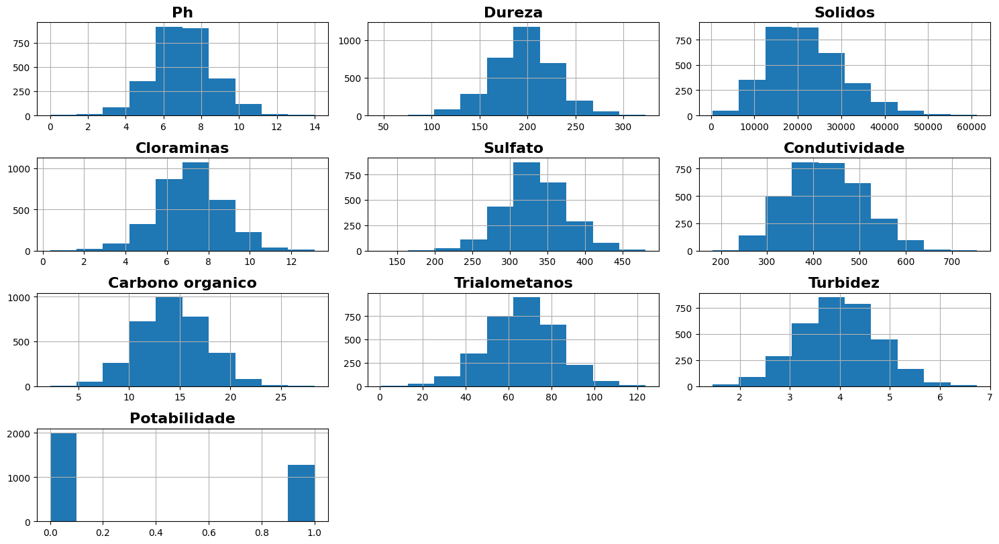

In [ ]:
# Histograma
titulos_water_potability = ["Ph", "Dureza", "Solidos", "Cloraminas", "Sulfato", \
                                   "Condutividade", "Carbono organico", "Trialometanos", \
                                   "Turbidez", "Potabilidade","",""]
water_potability.hist(figsize=(15,10), layout=(5,3))
for i, ax in enumerate(plt.gcf().axes):
    if i < len(titulos_water_potability):
        ax.set_title(titulos_water_potability[i], fontsize=16, fontweight="bold")
plt.tight_layout()
plt.show()

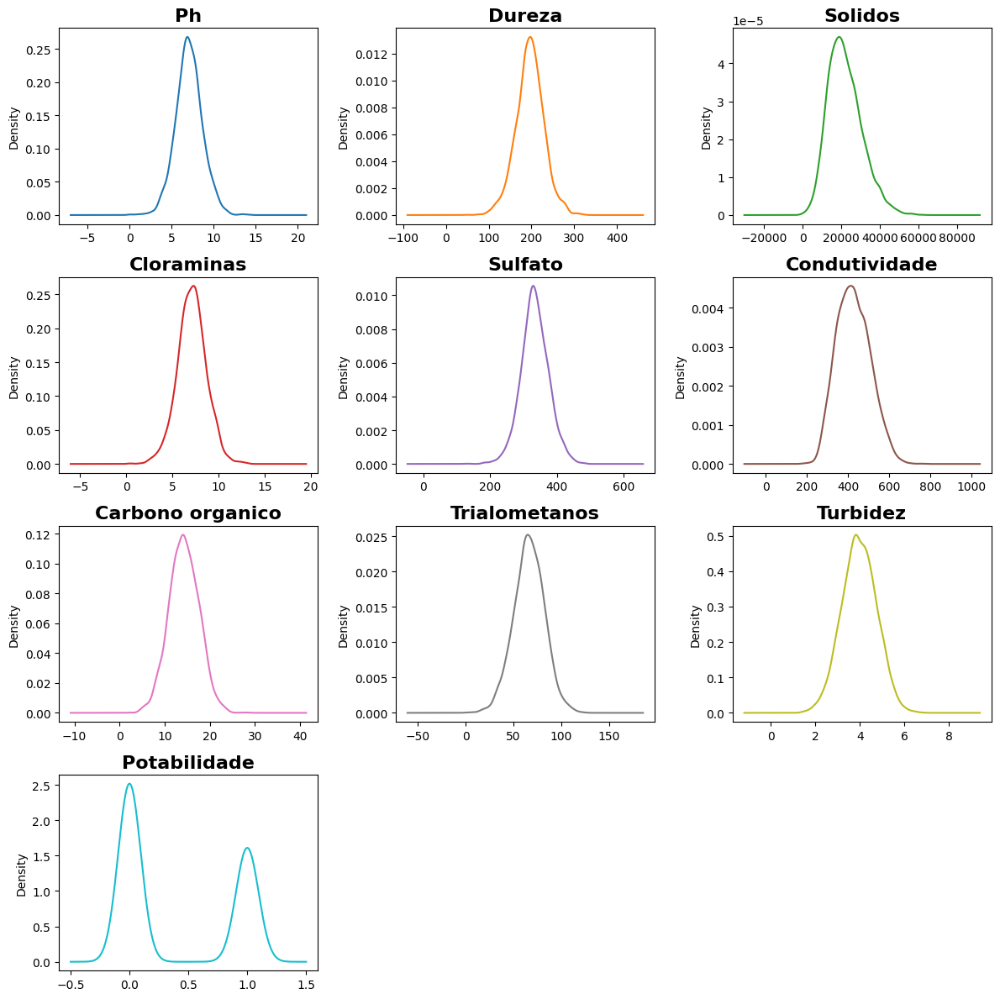

In [ ]:
# Density Plot
water_potability.plot(kind='density', subplots=True, layout=(4,3), sharex=False, figsize=(12,12), grid=False, legend=False)
for i, ax in enumerate(plt.gcf().axes):
    ax.set_title(titulos_water_potability[i], fontsize=16, fontweight="bold")
plt.tight_layout()
plt.show()

##### 2.2.3 O BoxPlot

O box plot é um gráfico que apresenta a distribuição de um conjunto de dados numéricos através de cinco estatísticas: valor mínimo, primeiro quartil, mediana, terceiro quartil e valor máximo. Ele é composto por um retângulo (a caixa), que se estende do primeiro ao terceiro quartil, uma linha vertical que representa a mediana e dois segmentos de reta (os bigodes) que se estendem aos valores mínimo e máximo.

Vamos utilizar o box plot para identificar a dispersão e a presença de outliers no nosso conjunto de dados. Esses outliers serão tratados posteriormente.

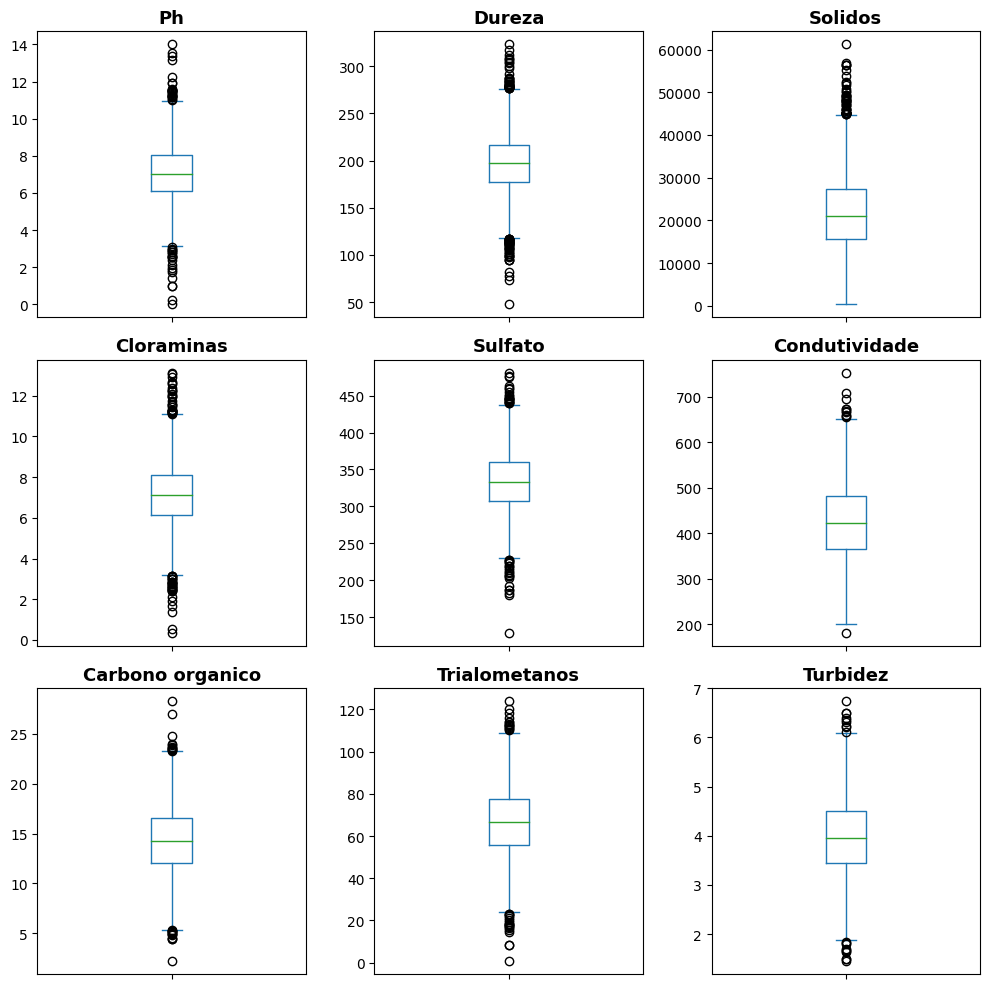

In [ ]:
# Gráfico box plot com o dataset water_potability
fig, axs = plt.subplots(nrows=3, ncols=3, figsize=(10,10))
for i, ax in enumerate(axs.flatten()):
    water_potability.iloc[:,i].plot(kind = 'box', ax=ax)
    ax.set_title(titulos_water_potability[i], fontsize=13, fontweight='bold')
    ax.grid(False)
    ax.tick_params(axis='x', labelbottom=False)
plt.tight_layout()

##### 2.2.4 Visualizações Multimodais

Visualizações multimodais referem-se ao uso de diferentes tipos de gráficos e técnicas de visualização para explorar e entender os dados. A ideia é aproveitar as diferentes visualizações para obter insights que não seriam possíveis com apenas um tipo de gráfico.


Uma matriz de correlação é uma tabela que mostra como duas variáveis ​​se relacionam entre si (covariança). O valor da correlação varia de -1 a 1, sendo -1 uma relação negativa (quando uma aumenta a outra diminui), 0 nenhuma relação e 1 uma relação positiva (quando uma aumenta a outra aumenta também). Um heatmap é uma forma visual de representar essa matriz, onde os valores mais altos aparecem em cores mais intensas, enquanto os valores mais baixos aparecem em cores mais suaves. Isso ajuda a identificar rapidamente as relações mais fortes e mais fracas entre as variáveis.

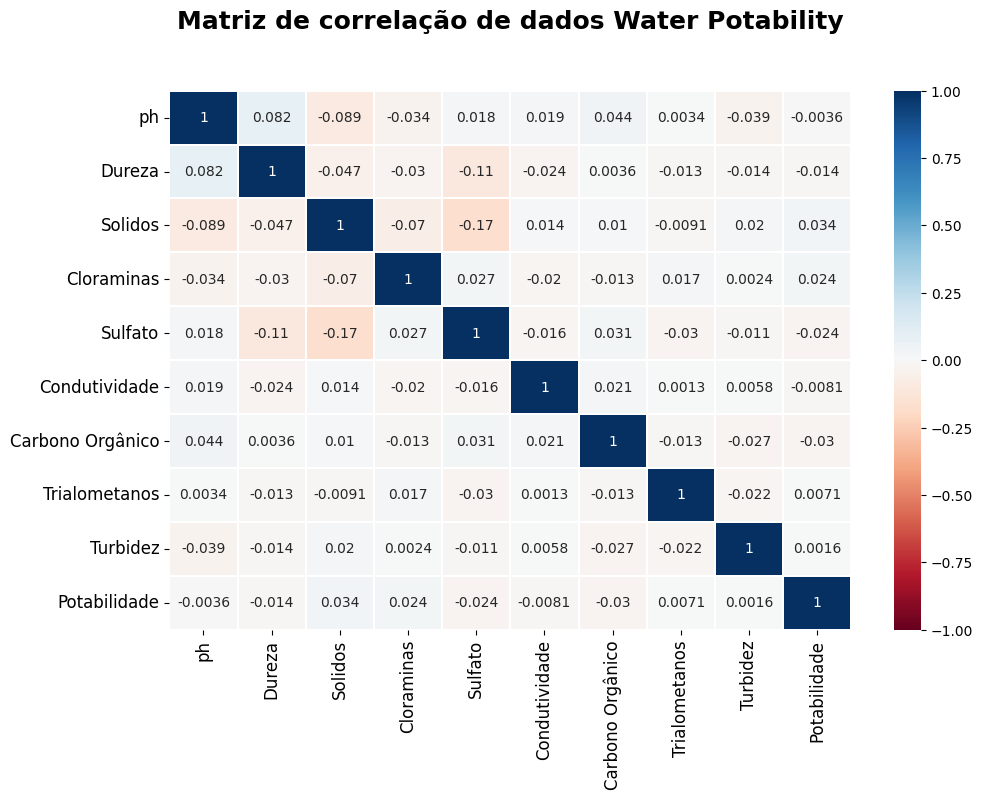

In [ ]:
# Matriz de Correlação com Matplotlib Seaborn para o subset de variáveis contínuas
fig, ax = plt.subplots(figsize=(11, 7), dpi=100)
ax.set_title("Matriz de correlação de dados Water Potability", fontsize=18, fontweight='bold', y=1.1)
sns.heatmap(water_potability.corr(), annot=True, cmap='RdBu', linewidths=0.3, ax=ax, vmin=-1, vmax=1);
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()

Os gráficos de disperssão (scatter plot) são comumente utilizado para visualizar a relação entre duas variáveis contínuas. Ele exibe pontos no plano cartesiano, onde cada ponto representa um par de valores das duas variáveis em análise. No entanto, o scatter plot também pode ser utilizado para visualizar a relação entre uma variável contínua e uma variável categórica. Nesse caso, os pontos são agrupados de acordo com as diferentes categorias da variável categórica e podem ser coloridos ou marcados de forma distinta para representar cada categoria.

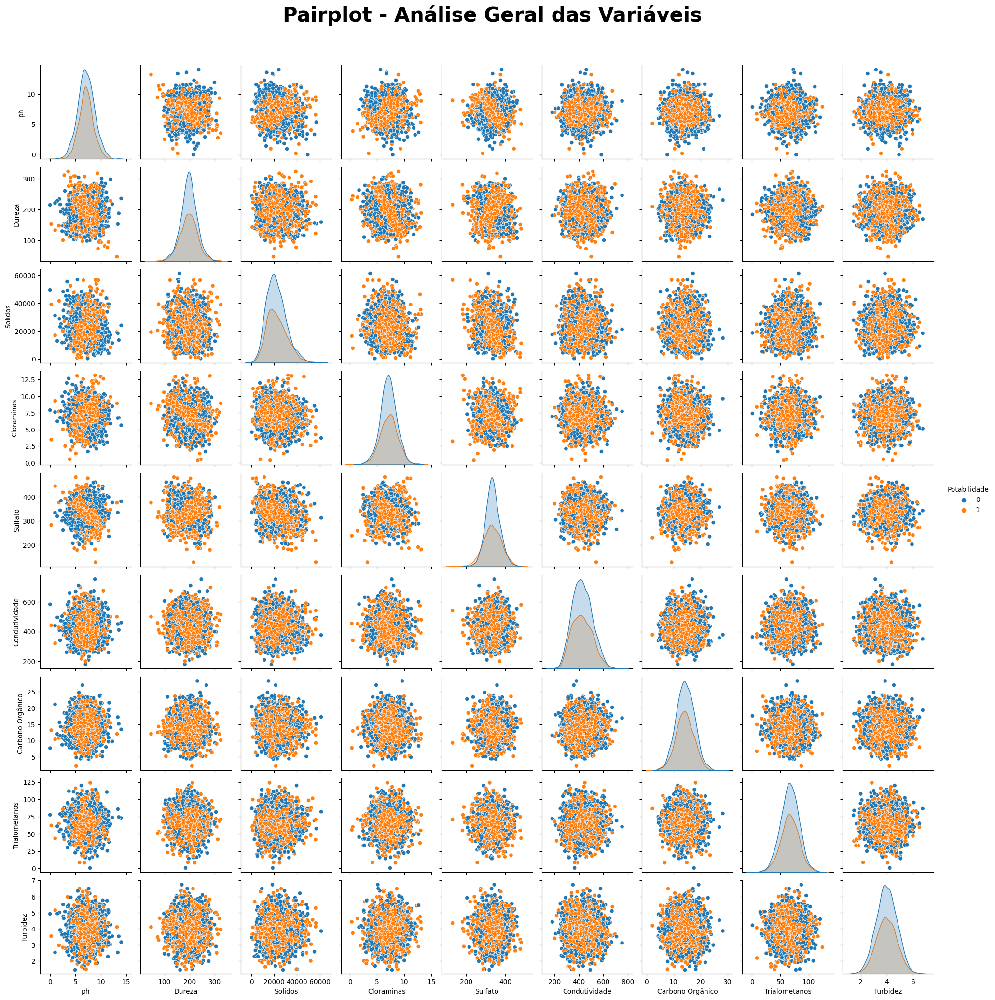

In [ ]:
# Scatter Plot com Seaborn - Variação 2
sns.pairplot(water_potability, hue="Potabilidade",  height = 2.2)
plt.suptitle("Pairplot - Análise Geral das Variáveis", fontsize=30, fontweight="bold", y=1.05)
plt.show()

### 2.3 Pré-Processamento de dados

Nesse momento realizaremos efetivamente a limpeza e preparação do nosso dataset para que possa ser utilizado no trabalho do MVP referente a Machine Learning.

######2.3.1.1 Outliers

Conforme visto na sessão 3.1.3 existem alguns possíveis outliers. Vamos substituir esses valores pelos valores respectivos de suas medianas e depois regerar o boxplot para verificar o resultado. Veremos que nem todos os valores marcados como outliers serão removidos mas apenas os que forem acima ou abaixo do que foi definido como limites superior e inferior (3x o valor do desvio padrão para mais e para menos).

In [ ]:
# Cálculo das medianas
mediana_ph = water_potability['ph'].median()
mediana_Dureza = water_potability['Dureza'].median()
mediana_Solidos = water_potability['Solidos'].median()
mediana_Cloraminas = water_potability['Cloraminas'].median()
mediana_Sulfato = water_potability['Sulfato'].median()
mediana_Condutividade = water_potability['Condutividade'].median()
mediana_Carbono_organico = water_potability['Carbono Orgânico'].median()
mediana_Trialometanos = water_potability['Trialometanos'].median()
mediana_Turbidez = water_potability['Turbidez'].median()

# Cálculo da média e do desvio padrão
media_ph = water_potability['ph'].mean()
desvio_padrao_ph = water_potability['ph'].std()
media_Dureza = water_potability['Dureza'].mean()
desvio_padrao_Dureza = water_potability['Dureza'].std()
media_Solidos = water_potability['Solidos'].mean()
desvio_padrao_Solidos = water_potability['Solidos'].std()
media_Cloraminas = water_potability['Cloraminas'].mean()
desvio_Cloraminas = water_potability['Cloraminas'].std()
media_Sulfato = water_potability['Sulfato'].mean()
desvio_padrao_Sulfato = water_potability['Sulfato'].std()
media_Condutividade = water_potability['Condutividade'].mean()
desvio_padrao_Condutividade = water_potability['Condutividade'].std()
media_Carbono_organico = water_potability['Carbono Orgânico'].mean()
desvio_padrao_Carbono_organico = water_potability['Carbono Orgânico'].std()
media_Trialometanos = water_potability['Trialometanos'].mean()
desvio_padrao_Trialometanos = water_potability['Trialometanos'].std()
media_Turbidez = water_potability['Turbidez'].mean()
desvio_padrao_Turbidez = water_potability['Turbidez'].std()

# Cálculo dos limites superiores
limite_superior_ph = media_ph + 3 * desvio_padrao_ph
limite_superior_Dureza = media_Dureza + 3 * desvio_padrao_Dureza
limite_superior_Solidos = media_Solidos + 3 * desvio_padrao_Solidos
limite_superior_Cloraminas = media_Cloraminas + 3 * desvio_Cloraminas
limite_superior_Sulfato = media_Sulfato + 3 * desvio_padrao_Sulfato
limite_superior_Condutividade = media_Condutividade + 3 * desvio_padrao_Condutividade
limite_superior_Carbono_organico = media_Carbono_organico + 3 * desvio_padrao_Carbono_organico
limite_superior_Trialometanos = media_Trialometanos + 3 * desvio_padrao_Trialometanos
limite_superior_Turbidez = media_Turbidez + 3 * desvio_padrao_Turbidez


# Cálculo dos limites inferiores
limite_inferior_ph = media_ph - 3 * desvio_padrao_ph
limite_inferior_Dureza = media_Dureza - 3 * desvio_padrao_Dureza
limite_inferior_Solidos = media_Solidos - 3 * desvio_padrao_Solidos
limite_inferior_Cloraminas = media_Cloraminas - 3 * desvio_Cloraminas
limite_inferior_Sulfato = media_Sulfato - 3 * desvio_padrao_Sulfato
limite_inferior_Condutividade = media_Condutividade - 3 * desvio_padrao_Condutividade
limite_inferior_Carbono_organico = media_Carbono_organico - 3 * desvio_padrao_Carbono_organico
limite_inferior_Trialometanos = media_Trialometanos - 3 * desvio_padrao_Trialometanos
limite_inferior_Turbidez = media_Turbidez - 3 * desvio_padrao_Turbidez

In [ ]:
# Substituição dos outliers superiores pela mediana
water_potability['ph'].mask((water_potability['ph'] > limite_superior_ph), mediana_ph, inplace=True)
water_potability['Dureza'].mask((water_potability['Dureza'] > limite_superior_Dureza), mediana_Dureza, inplace=True)
water_potability['Solidos'].mask((water_potability['Solidos'] > limite_superior_Solidos), mediana_Solidos, inplace=True)
water_potability['Cloraminas'].mask((water_potability['Cloraminas'] > limite_superior_Cloraminas), mediana_Cloraminas, inplace=True)
water_potability['Sulfato'].mask((water_potability['Sulfato'] > limite_superior_Sulfato), mediana_Sulfato, inplace=True)
water_potability['Condutividade'].mask((water_potability['Condutividade'] > limite_superior_Condutividade), mediana_Condutividade, inplace=True)
water_potability['Carbono Orgânico'].mask((water_potability['Carbono Orgânico'] > limite_superior_Carbono_organico), mediana_Carbono_organico, inplace=True)
water_potability['Trialometanos'].mask((water_potability['Trialometanos'] > limite_superior_Trialometanos), mediana_Trialometanos, inplace=True)
water_potability['Turbidez'].mask((water_potability['Turbidez'] > limite_superior_Turbidez), mediana_Turbidez, inplace=True)

# Substituição dos outliers inferiores pela mediana
water_potability['ph'].mask((water_potability['ph'] < limite_inferior_ph), mediana_ph, inplace=True)
water_potability['Dureza'].mask((water_potability['Dureza'] < limite_inferior_Dureza), mediana_Dureza, inplace=True)
water_potability['Solidos'].mask((water_potability['Solidos'] < limite_inferior_Solidos), mediana_Solidos, inplace=True)
water_potability['Cloraminas'].mask((water_potability['Cloraminas'] < limite_inferior_Cloraminas), mediana_Cloraminas, inplace=True)
water_potability['Sulfato'].mask((water_potability['Sulfato'] < limite_inferior_Sulfato), mediana_Sulfato, inplace=True)
water_potability['Condutividade'].mask((water_potability['Condutividade'] < limite_inferior_Condutividade), mediana_Condutividade, inplace=True)
water_potability['Carbono Orgânico'].mask((water_potability['Carbono Orgânico'] < limite_inferior_Carbono_organico), mediana_Carbono_organico, inplace=True)
water_potability['Trialometanos'].mask((water_potability['Trialometanos'] < limite_inferior_Trialometanos), mediana_Trialometanos, inplace=True)
water_potability['Turbidez'].mask((water_potability['Turbidez'] < limite_inferior_Turbidez), mediana_Turbidez, inplace=True)

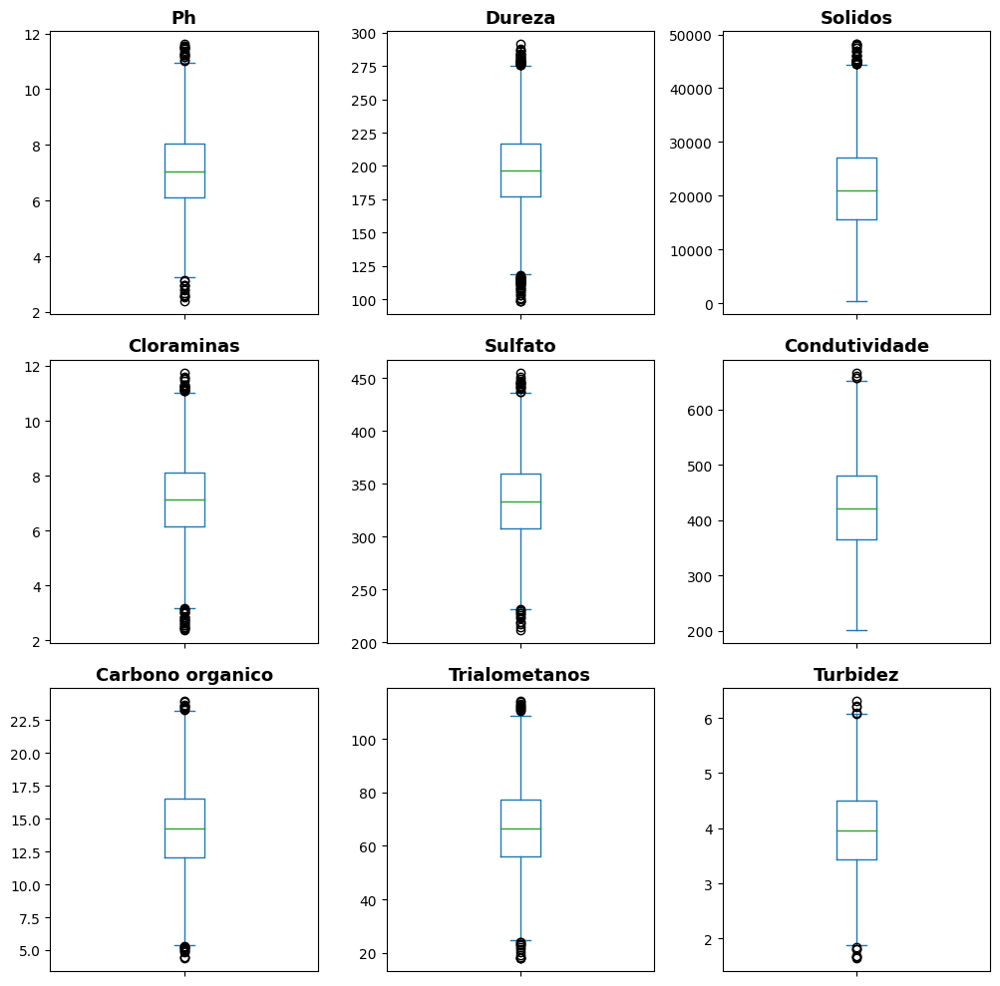

In [ ]:
# Gráfico box plot com o dataset reduzido water_potability
fig, axs = plt.subplots(nrows=3, ncols=3, figsize=(10,10))
for i, ax in enumerate(axs.flatten()):
    water_potability.iloc[:,i].plot(kind = 'box', ax=ax)
    ax.set_title(titulos_water_potability[i], fontsize=13, fontweight='bold')
    ax.grid(False)
    ax.tick_params(axis='x', labelbottom=False)
plt.tight_layout()

######2.3.1.2 Valores inválidos

O próximo passo será a confirmação da presença de valores inválidos no dataset e o tratamento dos mesmo. Vou executar apenas a busca pelos valores nulos. A busca por valores zero como possíveis valores inválidos não será necessária porque conforme comentado anteriormente o unico zero existente (na coluna ph) foi tratado como outlier.

ph                  491
Dureza                0
Solidos               0
Cloraminas            0
Sulfato             781
Condutividade         0
Carbono Orgânico      0
Trialometanos       162
Turbidez              0
Potabilidade          0
dtype: int64


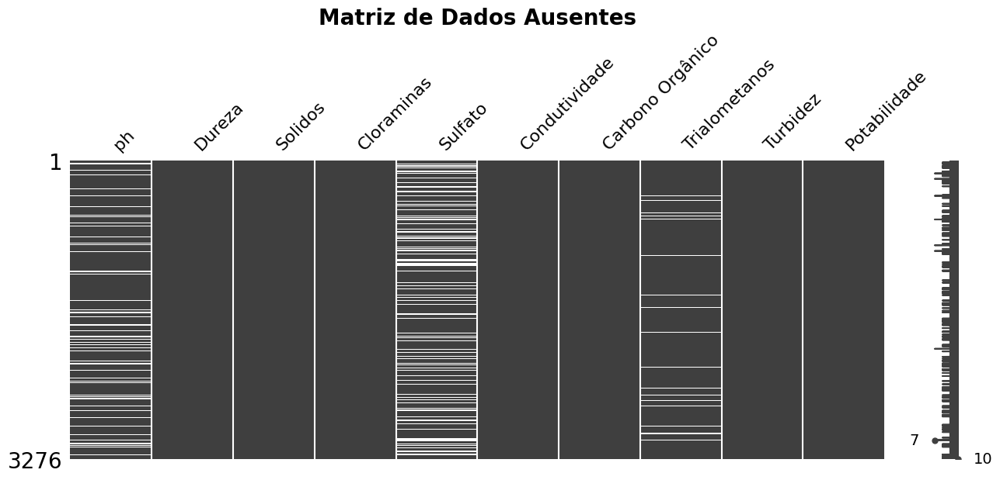

In [ ]:
# Verificando os valores nulos
print(water_potability.isnull().sum())

# exibindo visualização matricial da nulidade do dataset
ms.matrix(water_potability, figsize=(15, 5))
plt.title("Matriz de Dados Ausentes", fontsize=20, fontweight="bold")
plt.show()

Substituindo então os valores inválidos pela mediana das colunas e verificando novamente a matriz de nulidade

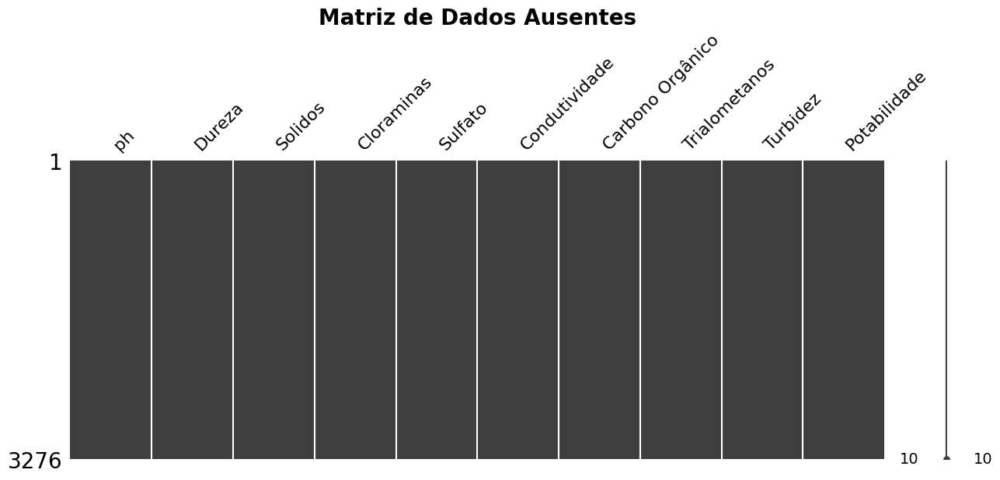

In [ ]:
# Substituindo os inválidos de 'ph' pela mediana da coluna
water_potability['ph'].fillna(mediana_ph, inplace=True)

# Substituindo os inválidos de 'Sulfato' pela mediana da coluna
water_potability['Sulfato'].fillna(mediana_Sulfato, inplace=True)

# Substituindo os inválidos de 'Trialometanos' pela mediana da coluna
water_potability['Trialometanos'].fillna(mediana_Trialometanos, inplace=True)

# exibindo visualização matricial do dataset limpo
ms.matrix(water_potability, figsize=(15, 5))
plt.title("Matriz de Dados Ausentes", fontsize=20, fontweight="bold")
plt.show()

Vamos confirmar pela contagem dos valores que agora todos possuem 3276 ocorrencias e que já não aparecem mais os valores faltantes

In [ ]:
# Faz um resumo estatístico do dataset (média, desvio padrão, mínimo, máximo e os quartis)
water_potability.describe()

,ph,Dureza,Solidos,Cloraminas,Sulfato,Condutividade,Carbono Orgânico,Trialometanos,Turbidez,Potabilidade
count,3276.000000,3276.000000,3276.000000,3276.000000,3276.000000,3276.000000,3276.000000,3276.000000,3276.000000,3276.000000
mean,7.077590,196.309504,21822.346385,7.110245,333.839347,425.777164,14.277220,66.475421,3.965177,0.390110
std,1.411900,31.790195,8436.066004,1.524007,34.666857,79.872145,3.279698,15.426859,0.770416,0.487849
min,2.376768,98.367915,320.942611,2.386653,211.851592,201.619737,4.371899,17.915723,1.641515,0.000000
25%,6.284351,177.091694,15666.690297,6.135761,317.582997,365.811312,12.066127,56.800812,3.440832,0.000000
50%,7.036752,196.967627,20924.994035,7.130299,333.073546,421.884968,14.218338,66.622485,3.955028,0.000000
75%,7.859644,216.458873,27173.342089,8.097221,350.133901,481.223518,16.545011,76.623913,4.497655,1.000000
max,11.621140,291.461897,48204.172192,11.753904,455.451234,666.690618,23.952450,114.208671,6.307678,1.000000


In [ ]:
water_potability.head(10)

,ph,Dureza,Solidos,Cloraminas,Sulfato,Condutividade,Carbono Orgânico,Trialometanos,Turbidez,Potabilidade
0,7.036752,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0
1,3.716080,129.422921,18630.057858,6.635246,333.073546,592.885359,15.180013,56.329076,4.500656,0
2,8.099124,224.236259,19909.541732,9.275884,333.073546,418.606213,16.868637,66.420093,3.055934,0
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0
5,5.584087,188.313324,28748.687739,7.544869,326.678363,280.467916,8.399735,54.917862,2.559708,0
6,10.223862,248.071735,28749.716544,7.513408,393.663396,283.651634,13.789695,84.603556,2.672989,0
7,8.635849,203.361523,13672.091764,4.563009,303.309771,474.607645,12.363817,62.798309,4.401425,0
8,7.036752,118.988579,14285.583854,7.804174,268.646941,389.375566,12.706049,53.928846,3.595017,0
9,11.180284,227.231469,25484.508491,9.077200,404.041635,563.885481,17.927806,71.976601,4.370562,0


In [ ]:
water_potability.tail(10)

,ph,Dureza,Solidos,Cloraminas,Sulfato,Condutividade,Carbono Orgânico,Trialometanos,Turbidez,Potabilidade
3266,8.372910,169.087052,14622.745494,7.547984,333.073546,464.525552,11.083027,38.435151,4.906358,1
3267,8.989900,215.047358,15921.412018,6.297312,312.931022,390.410231,9.899115,55.069304,4.613843,1
3268,6.702547,207.321086,17246.920347,7.708117,304.510230,329.266002,16.217303,28.878601,3.442983,1
3269,11.491011,196.967627,37188.826022,9.263166,258.930600,439.893618,16.172755,41.558501,4.369264,1
3270,6.069616,186.659040,26138.780191,7.747547,345.700257,415.886955,12.067620,60.419921,3.669712,1
3271,4.668102,193.681735,47580.991603,7.166639,359.948574,526.424171,13.894419,66.687695,4.435821,1
3272,7.808856,193.553212,17329.802160,8.061362,333.073546,392.449580,19.903225,66.622485,2.798243,1
3273,9.419510,175.762646,33155.578218,7.350233,333.073546,432.044783,11.039070,69.845400,3.298875,1
3274,5.126763,230.603758,11983.869376,6.303357,333.073546,402.883113,11.168946,77.488213,4.708658,1
3275,7.874671,195.102299,17404.177061,7.509306,333.073546,327.459760,16.140368,78.698446,2.309149,1


In [ ]:
# Verificando os valores nulos
print(water_potability.isnull().sum())

ph                  0
Dureza              0
Solidos             0
Cloraminas          0
Sulfato             0
Condutividade       0
Carbono Orgânico    0
Trialometanos       0
Turbidez            0
Potabilidade        0
dtype: int64


Nesse momento o dataset será salvo local no disco efêmero com o nome water_potability_limpo e eu farei o upload dele para o github para ser utilizado pelo segundo MVP do curso. Dessa forma se houver algum problema na execução do pré processamento, a parte referente ao MVP da segunda sprint poderá executar normalmente.

In [ ]:
# Salvar o DataFrame em um arquivo CSV
filename = "datasets\water_potability_limpo.csv"

# salvando do dataset limpo sem os nome das colunascolunas
water_potability.to_csv(filename, header=False, index=False)

##3.0 Recursos Avançados Aplicados ao Aprendizado Supervisionado

#### 3.1 Definição de funções

iniciarei essa segunda parte definindo duas funções que me ajudarão na avaliação do modelo que está sendo desenvolvido. Uma para a execução do ensemble e a outra para a execução da pipeline. Executei alguns testes variando os parametros função base, numero de arvores e a max features. Fechei nos valoes abaixo

In [ ]:
def avalia_modelo(X_train, y_train):
    np.random.seed(semente)

    models = []
    results = []
    names = []

    models.append(('LR', LogisticRegression(max_iter=200)))
    models.append(('KNN', KNeighborsClassifier()))
    models.append(('CART', DecisionTreeClassifier()))
    models.append(('NB', GaussianNB()))
    models.append(('SVM', SVC()))

    base = DecisionTreeClassifier()
    num_trees = 100
    max_features = 5

    bases = []
    model1 = LogisticRegression(max_iter=200)
    bases.append(('logistic', model1))
    model2 = DecisionTreeClassifier()
    bases.append(('cart', model2))
    model3 = SVC()
    bases.append(('svm', model3))

    models.append(('Bagging', BaggingClassifier(base_estimator=base, n_estimators=num_trees)))
    models.append(('RF', RandomForestClassifier(n_estimators=num_trees, max_features=max_features)))
    models.append(('ET', ExtraTreesClassifier(n_estimators=num_trees, max_features=max_features)))
    models.append(('Ada', AdaBoostClassifier(n_estimators=num_trees)))
    models.append(('GB', GradientBoostingClassifier(n_estimators=num_trees)))
    models.append(('Voting', VotingClassifier(bases)))

    for name, model in models:
        cv_results = cross_val_score(model, X_train, y_train, cv=kfold, scoring=scoring)
        results.append(cv_results)
        names.append(name)
        msg = "%s: %.4f (%.4f)" % (name, cv_results.mean(), cv_results.std())
        print(msg)

    fig = plt.figure()
    fig.suptitle('Comparação da Acurácia dos Modelos')
    ax = fig.add_subplot(111)
    plt.boxplot(results)
    ax.set_xticklabels(names)
    plt.show()

In [ ]:
def avalia_pipelines(X_train, y_train):
    np.random.seed(semente)

    # Listas para armazenar os armazenar os pipelines e os resultados para todas as visões do dataset
    pipelines = []
    results = []
    names = []

    base = DecisionTreeClassifier()
    num_trees = 100
    max_features = 5

    # Criando os modelos para o VotingClassifier
    bases = []
    model1 = LogisticRegression(max_iter=200)
    bases.append(('logistic', model1))
    model2 = DecisionTreeClassifier()
    bases.append(('cart', model2))
    model3 = SVC()
    bases.append(('svm', model3))

    # Criando os elementos do pipeline

    # Algoritmos que serão utilizados
    reg_log = ('LR', LogisticRegression(max_iter=200))
    knn = ('KNN', KNeighborsClassifier())
    cart = ('CART', DecisionTreeClassifier())
    naive_bayes = ('NB', GaussianNB())
    svm = ('SVM', SVC())
    bagging = ('Bag', BaggingClassifier(base_estimator=base, n_estimators=num_trees))
    random_forest = ('RF', RandomForestClassifier(n_estimators=num_trees, max_features=max_features))
    extra_trees = ('ET', ExtraTreesClassifier(n_estimators=num_trees, max_features=max_features))
    adaboost = ('Ada', AdaBoostClassifier(n_estimators=num_trees))
    gradient_boosting = ('GB', GradientBoostingClassifier(n_estimators=num_trees))
    voting = ('Voting', VotingClassifier(bases))

    # Transformações que serão utilizadas
    standard_scaler = ('StandardScaler', StandardScaler())
    min_max_scaler = ('MinMaxScaler', MinMaxScaler())


    # Montando os pipelines

    # Dataset original
    pipelines.append(('LR-orig', Pipeline([reg_log])))
    pipelines.append(('KNN-orig', Pipeline([knn])))
    pipelines.append(('CART-orig', Pipeline([cart])))
    pipelines.append(('NB-orig', Pipeline([naive_bayes])))
    pipelines.append(('SVM-orig', Pipeline([svm])))
    pipelines.append(('Bag-orig', Pipeline([bagging])))
    pipelines.append(('RF-orig', Pipeline([random_forest])))
    pipelines.append(('ET-orig', Pipeline([extra_trees])))
    pipelines.append(('Ada-orig', Pipeline([adaboost])))
    pipelines.append(('GB-orig', Pipeline([gradient_boosting])))
    pipelines.append(('Vot-orig', Pipeline([voting])))

    # Dataset Padronizado
    pipelines.append(('LR-padr', Pipeline([standard_scaler, reg_log])))
    pipelines.append(('KNN-padr', Pipeline([standard_scaler, knn])))
    pipelines.append(('CART-padr', Pipeline([standard_scaler, cart])))
    pipelines.append(('NB-padr', Pipeline([standard_scaler, naive_bayes])))
    pipelines.append(('SVM-padr', Pipeline([standard_scaler, svm])))
    pipelines.append(('Bag-padr', Pipeline([standard_scaler, bagging])))
    pipelines.append(('RF-padr', Pipeline([standard_scaler, random_forest])))
    pipelines.append(('ET-padr', Pipeline([standard_scaler, extra_trees])))
    pipelines.append(('Ada-padr', Pipeline([standard_scaler, adaboost])))
    pipelines.append(('GB-padr', Pipeline([standard_scaler, gradient_boosting])))
    pipelines.append(('Vot-padr', Pipeline([standard_scaler, voting])))

    # Dataset Normalizado
    pipelines.append(('LR-norm', Pipeline([min_max_scaler, reg_log])))
    pipelines.append(('KNN-norm', Pipeline([min_max_scaler, knn])))
    pipelines.append(('CART-norm', Pipeline([min_max_scaler, cart])))
    pipelines.append(('NB-norm', Pipeline([min_max_scaler, naive_bayes])))
    pipelines.append(('SVM-norm', Pipeline([min_max_scaler, svm])))
    pipelines.append(('Bag-norm', Pipeline([min_max_scaler, bagging])))
    pipelines.append(('RF-norm', Pipeline([min_max_scaler, random_forest])))
    pipelines.append(('ET-norm', Pipeline([min_max_scaler, extra_trees])))
    pipelines.append(('Ada-norm', Pipeline([min_max_scaler, adaboost])))
    pipelines.append(('GB-norm', Pipeline([min_max_scaler, gradient_boosting])))
    pipelines.append(('Vot-norm', Pipeline([min_max_scaler, voting])))

    # Executando os pipelines
    for name, model in pipelines:
        cv_results = cross_val_score(model, X_train, y_train, cv=kfold, scoring=scoring)
        results.append(cv_results)
        names.append(name)
        msg = "%s: %.4f (%.4f)" % (name, cv_results.mean(), cv_results.std()) # formatando para 3 casas decimais
        print(msg)

    # Boxplot de comparação dos modelos
    fig = plt.figure(figsize=(25,6))
    fig.suptitle('Comparação dos Modelos - Dataset orginal, padronizado e normalizado')
    ax = fig.add_subplot(111)
    plt.boxplot(results)
    ax.set_xticklabels(names, rotation=90)
    plt.show()

#### 3.2 Carregamento do dataset

Carregarei agora o dataset Water Potability Limpo que foi preparado na fase anterior e que foi previamente disponibilizado no Github. Continuaremos utilizando para ele o nome de "water_potability".

Após o carregamento farei aquela validação basica parfa verificar se tudo está nos conformes.

In [ ]:
# Carrega a variavel com o endereço do arquivo no github que contem o dataset
filename = "https://raw.githubusercontent.com/JGCMachado/Datasets/main/water_potability_limpo.csv"

colunas = ['ph', 'Dureza', 'Solidos', 'Cloraminas', 'Sulfato', 'Condutividade', 'Carbono Orgânico', 'Trialometanos', 'Turbidez', 'Potabilidade']

# carga do dataset adicionando os nomes das colunas
water_potability = pd.read_csv(filename, names=colunas)

In [ ]:
# verifica o tipo do dataset water_potability
print(type(water_potability))

<class 'pandas.core.frame.DataFrame'>


In [ ]:
# exibe as primeiras linhas para verificar se a importação ocorreu de acordo com o esperado
water_potability.head()

,ph,Dureza,Solidos,Cloraminas,Sulfato,Condutividade,Carbono Orgânico,Trialometanos,Turbidez,Potabilidade
0,7.036752,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0
1,3.716080,129.422921,18630.057858,6.635246,333.073546,592.885359,15.180013,56.329076,4.500656,0
2,8.099124,224.236259,19909.541732,9.275884,333.073546,418.606213,16.868637,66.420093,3.055934,0
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0


In [ ]:
# Verificando novamente os tipos de dados das colunas
water_potability.dtypes

ph                  float64
Dureza              float64
Solidos             float64
Cloraminas          float64
Sulfato             float64
Condutividade       float64
Carbono Orgânico    float64
Trialometanos       float64
Turbidez            float64
Potabilidade          int64
dtype: object

In [ ]:
# distribuição das classes
print(water_potability.groupby('Potabilidade').size())

Potabilidade
0    1998
1    1278
dtype: int64


###3.3 Seleção de Atributos (Feature Selection)

Vou iniciar a seleção de atributos gerando novamente a Matriz de Correlação. Dessa vez os dados já estão pré processados e limpos.

Retornei nesse momento a Matriz de Correlação porque entendo que é nela que iniciamos a nossa seleção de atributos, quando buscamos aqueles que possuem maior afinidade, e gostaria de comparar os atributos selecionados nos metodos de feature selection com ela.

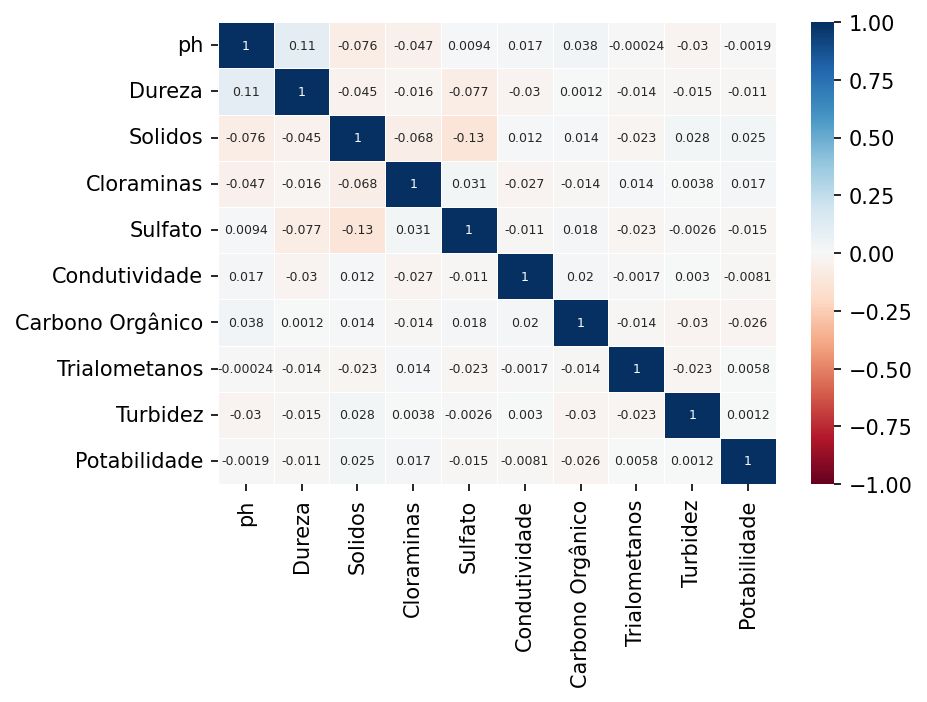

In [ ]:
# Matriz de Correlação com Matplotlib Seaborn
fig, ax = plt.subplots(figsize=(6, 4), dpi=150)
sns.heatmap(water_potability.corr(), annot=True, cmap='RdBu', linewidths=0.3, ax=ax, annot_kws={'fontsize': 6} , vmin=-1, vmax=1 );

Separando os valores de output X e Y para serem trabalhados na sequência. Sereão executados para a seleção de atributos os métodos SelectKBest, Eliminação Recursiva de Atributos com algoritmo de regressão logística (problema de uma classificação binária) e por fim o método de Importância de Atributos com ExtraTrees.

Para cada seleção o resultado de X será armazenado separadamente em variáveis para serem testados no aprendizado do modelo. X_selected_SKB para SelectKBest, X_selected_ERL para eliminação recursiva de atributos com regressão linear e X_selected_IAE para importância de atributos com extratrees

In [ ]:
# Separando os valores de output (X) do dataset
water_potability_x_atributos = water_potability.values[:,0:9]
# Separando os valores de output (Y) do dataset
water_potability_y_target = water_potability.values[:,9]

In [ ]:
# SelectKBest
from sklearn.feature_selection import SelectKBest, mutual_info_classif
# Seleção de atributos com SelectKBest
best_var = SelectKBest(score_func=f_classif, k=5)

# Executa a função de pontuação em (X, y) e obtém os atributos selecionados
fit = best_var.fit(water_potability_x_atributos, water_potability_y_target)

# Reduz X para os atributos selecionados
X_selected_SKB = fit.transform(water_potability_x_atributos)

# Resultados
print('\nNúmero original de atributos:', water_potability_x_atributos.shape[1])
print('\nNúmero reduzido de atributos:', X_selected_SKB.shape[1])

# Exibe os atributos orginais
print("\nAtributos Originais:", water_potability.columns[0:9])

# Exibe as pontuações de cada atributos e os 4 escolhidas (com as pontuações mais altas)
np.set_printoptions(precision=3) # 3 casas decimais
print("\nScores dos Atributos Originais:", fit.scores_)
print("\nAtributos Selecionados:", best_var.get_feature_names_out(input_features=water_potability.columns[0:9]))


Número original de atributos: 9

Número reduzido de atributos: 5

Atributos Originais: Index(['ph', 'Dureza', 'Solidos', 'Cloraminas', 'Sulfato', 'Condutividade',
       'Carbono Orgânico', 'Trialometanos', 'Turbidez'],
      dtype='object')

Scores dos Atributos Originais: [0.012 0.363 2.12  0.926 0.772 0.213 2.228 0.111 0.005]

Atributos Selecionados: ['Dureza' 'Solidos' 'Cloraminas' 'Sulfato' 'Carbono Orgânico']


In [ ]:
# Eliminação Recursiva de Atributos

# Criação do modelo
modelo = LogisticRegression(max_iter=50)

# Eliminação Recursiva de Atributos
rfe = RFE(modelo, n_features_to_select=5)
fit = rfe.fit(water_potability_x_atributos, water_potability_y_target)

# Reduz X para os atributos selecionados
X_selected_ERA = fit.fit_transform(water_potability_x_atributos, water_potability_y_target)

# Print dos resultados
print("Atributos Originais:", water_potability.columns[0:9])

# Exibe os atributos selecionados (marcados como True em "Atributos Selecionados"
# e com valor 1 em "Ranking dos Atributos")
print("\nAtributos Selecionados: %s" % fit.support_)
print("\nRanking de atributos: %s" % fit.ranking_)
print("\nQtd de melhores Atributos: %d" % fit.n_features_)
print("\nNomes dos Atributos Selecionados: %s" % fit.get_feature_names_out(input_features=water_potability.columns[0:9]))

Atributos Originais: Index(['ph', 'Dureza', 'Solidos', 'Cloraminas', 'Sulfato', 'Condutividade',
       'Carbono Orgânico', 'Trialometanos', 'Turbidez'],
      dtype='object')

Atributos Selecionados: [ True False False  True  True False  True False  True]

Ranking de atributos: [1 2 5 1 1 4 1 3 1]

Qtd de melhores Atributos: 5

Nomes dos Atributos Selecionados: ['ph' 'Cloraminas' 'Sulfato' 'Carbono Orgânico' 'Turbidez']


In [ ]:
# Importância de Atributos com ExtraTrees

# Criação do modelo para seleção de atributos
modelo = ExtraTreesClassifier(n_estimators=50)
modelo.fit(water_potability_x_atributos,water_potability_y_target)

importances = modelo.feature_importances_
threshold = 0.009  # Limite de importância para seleção

# Reduz X para os atributos selecionados
mask = importances > threshold
X_selected_IAE = water_potability_x_atributos[:, mask]

# Exibe os atributos orginais
print("\nAtributos Originais:", water_potability.columns[0:9])

# Exibe a pontuação de importância para cada atributo (quanto maior a pontuação, mais importante é o atributo).
print(modelo.feature_importances_)


Atributos Originais: Index(['ph', 'Dureza', 'Solidos', 'Cloraminas', 'Sulfato', 'Condutividade',
       'Carbono Orgânico', 'Trialometanos', 'Turbidez'],
      dtype='object')
[0.124 0.116 0.113 0.113 0.125 0.105 0.102 0.103 0.099]


Analisando os resultados constatamos que o método SelectKBest selecionou os mesmos atributos identificados na Matriz de Correlação e que esses mesmos atributos foram quase que unanimidade nos métodos.

Atributos Selecionados Matriz Correlação:

**['Dureza', 'Solidos', 'Cloraminas', 'Sulfato', 'Carbono Orgânico']**

Atributos Selecionados Select KBest:

**[     'Dureza', 'Solidos', 'Cloraminas', 'Sulfato', 'Carbono Orgânico']**

Atributos Selecionados Eliminação Recursiva de Atributos:

**['ph',                    'Cloraminas', 'Sulfato', 'Carbono Orgânico', 'Turbidez']**

Atributos Selecionados Importância de Atributos com ExtraTrees:

**['ph', 'Dureza', 'Solidos', 'Cloraminas', 'Sulfato']**

Realizei algumas testes variando o numero de atributos selecionados entre 4 e 6 e o que melhor performou foi 5 atributos. Variei também o parâmetros max_iter da regressão logistica na eliminação recursiva e o n_estimators da ExtraTrees e ambos estabilizaram a partir do valor 50

Para o SelectKBest foram testadas as score functions f_classif, chi2 e mutual_info_classific. O resultado foi praticamente igual sendo a f_classific ligeiramente melhor e por tanto seguirei com a f_classific

**f_classific**

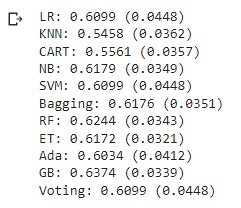


**chi2**

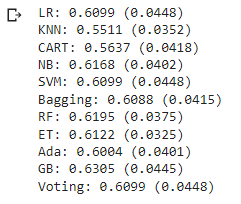


**mutual_info_classif**

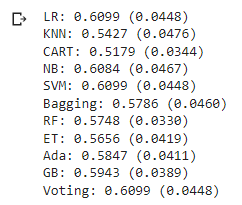

In [ ]:
# Definir percentual para teste e semente
percentual_teste = 0.20
semente = 9

In [ ]:
# Criando os folds para a validação cruzada
scoring = 'accuracy'
num_particoes = 20 # número de folds da validação cruzada
kfold = KFold(n_splits=num_particoes, shuffle=True, random_state=semente) # faz o particionamento em 20 folds

##4.0 Modelagem

#### 4.1 Avaliação dos modelos

Na próxima etapa vou utilizar as funções criadas no ítem 3.1 (avalia_modelo e avalia_pipelines para criar modelos e avaliar cada um dos grupos de dados criados na feature selection. Primeiramente criarei uma linha base e depois nas pipelines avaliarei também os dados padronizados e normalizados. Ao final executarei a otimização dos hiper parametros para a que tiver melhor desempenho

**Avaliando os dados gerados com o SelectKbest**

Embora na execução com os dados "brutos" selecionados pelo SelectKBest (sem normalizar ou padronizar) o algoritmo de Reforço de Gradiente (GradientBoostingClassifier) tenha alcançado um resultado um pouco melhor atingindo 63,7%, vemos que quando normalizamos e padronizamos os dados o algoritmo SVM conseguiu melhorar a acurácia (64,6%)

LR: 0.6099 (0.0448)
KNN: 0.5458 (0.0362)
CART: 0.5561 (0.0357)
NB: 0.6179 (0.0349)
SVM: 0.6099 (0.0448)
Bagging: 0.6176 (0.0351)
RF: 0.6244 (0.0343)
ET: 0.6172 (0.0321)
Ada: 0.6034 (0.0412)
GB: 0.6374 (0.0339)
Voting: 0.6099 (0.0448)


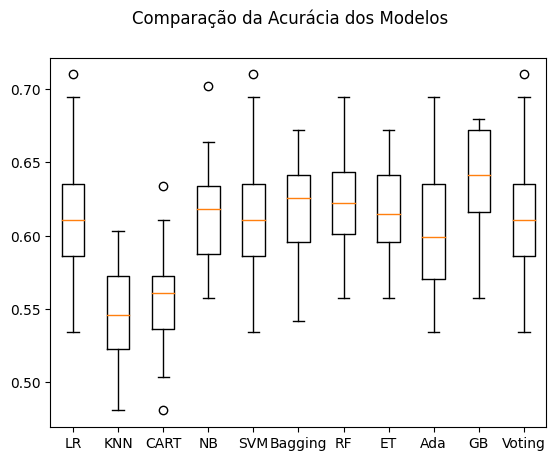

In [ ]:
# Separação em conjunto de treino e conjunto de teste com holdout utilizando SelectKBest
X_train, X_test, y_train, y_test = train_test_split(X_selected_SKB, water_potability_y_target, test_size=percentual_teste, random_state=semente) # faz a divisão

# Chamando a função avalia_modelo com o conjunto de treino
avalia_modelo(X_train, y_train)

LR-orig: 0.6099 (0.0448)
KNN-orig: 0.5458 (0.0362)
CART-orig: 0.5561 (0.0357)
NB-orig: 0.6179 (0.0349)
SVM-orig: 0.6099 (0.0448)
Bag-orig: 0.6176 (0.0351)
RF-orig: 0.6244 (0.0343)
ET-orig: 0.6172 (0.0321)
Ada-orig: 0.6034 (0.0412)
GB-orig: 0.6374 (0.0339)
Vot-orig: 0.6099 (0.0448)
LR-padr: 0.6099 (0.0448)
KNN-padr: 0.6080 (0.0395)
CART-padr: 0.5527 (0.0403)
NB-padr: 0.6179 (0.0345)
SVM-padr: 0.6435 (0.0426)
Bag-padr: 0.6156 (0.0376)
RF-padr: 0.6176 (0.0353)
ET-padr: 0.6172 (0.0276)
Ada-padr: 0.6034 (0.0412)
GB-padr: 0.6378 (0.0339)
Vot-padr: 0.6393 (0.0385)
LR-norm: 0.6099 (0.0448)
KNN-norm: 0.6073 (0.0362)
CART-norm: 0.5561 (0.0402)
NB-norm: 0.6179 (0.0345)
SVM-norm: 0.6466 (0.0421)
Bag-norm: 0.6229 (0.0375)
RF-norm: 0.6202 (0.0381)
ET-norm: 0.6237 (0.0332)
Ada-norm: 0.6034 (0.0412)
GB-norm: 0.6370 (0.0340)
Vot-norm: 0.6405 (0.0409)


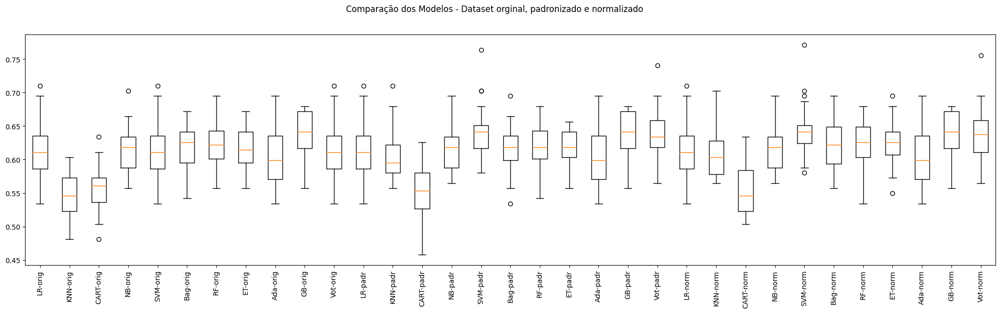

In [ ]:
# Chamando a função avalia_pipelines
avalia_pipelines(X_train, y_train)

**Avaliando os dados gerados com a Eliminação Recursiva de Atributos**

Para os dados selecionados utilizando a Eliminação Recursiva de Atributos ocorreu o mesmo comportamento. Na execução para o modelo o algoritmo de Reforço de Gradiente (GradientBoostingClassifier) alcançou um resultado um pouco melhor atingindo 63,9%, mas quando normalizamos e padronizamos os dados, mesmo o GB melhorando para 64,0%, o algoritmo SVM conseguiu ser um pouco melhor com acurácia de 64,2 tanto para os dados padronizados quanto para os dados normalizados

LR: 0.6099 (0.0448)
KNN: 0.5718 (0.0388)
CART: 0.5782 (0.0453)
NB: 0.6214 (0.0348)
SVM: 0.6099 (0.0448)
Bagging: 0.6240 (0.0373)
RF: 0.6172 (0.0346)
ET: 0.6164 (0.0407)
Ada: 0.6011 (0.0380)
GB: 0.6397 (0.0412)
Voting: 0.6099 (0.0448)


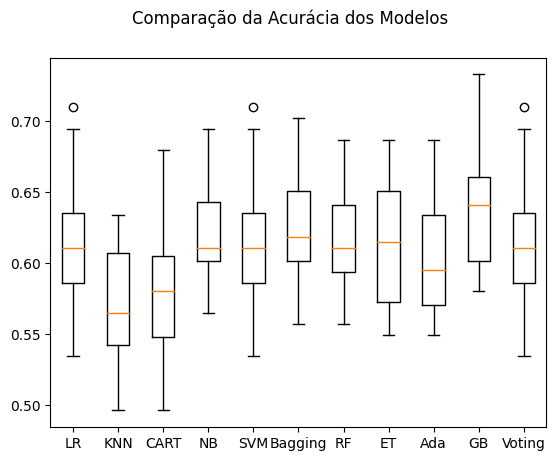

In [ ]:
# Separação em conjunto de treino e conjunto de teste com holdout utilizando Eliminação Recursiva de Atributos
X_train, X_test, y_train, y_test = train_test_split(X_selected_ERA, water_potability_y_target, test_size=percentual_teste, random_state=semente) # faz a divisão

# Chamando a função avalia_modelo com o conjunto de treino
avalia_modelo(X_train, y_train)

LR-orig: 0.6099 (0.0448)
KNN-orig: 0.5718 (0.0388)
CART-orig: 0.5782 (0.0453)
NB-orig: 0.6214 (0.0348)
SVM-orig: 0.6099 (0.0448)
Bag-orig: 0.6240 (0.0373)
RF-orig: 0.6172 (0.0346)
ET-orig: 0.6164 (0.0407)
Ada-orig: 0.6011 (0.0380)
GB-orig: 0.6397 (0.0412)
Vot-orig: 0.6099 (0.0448)
LR-padr: 0.6099 (0.0448)
KNN-padr: 0.5939 (0.0469)
CART-padr: 0.5721 (0.0448)
NB-padr: 0.6214 (0.0348)
SVM-padr: 0.6420 (0.0419)
Bag-padr: 0.6172 (0.0394)
RF-padr: 0.6115 (0.0408)
ET-padr: 0.6214 (0.0437)
Ada-padr: 0.6011 (0.0380)
GB-padr: 0.6405 (0.0400)
Vot-padr: 0.6351 (0.0401)
LR-norm: 0.6099 (0.0448)
KNN-norm: 0.5943 (0.0455)
CART-norm: 0.5740 (0.0494)
NB-norm: 0.6214 (0.0348)
SVM-norm: 0.6424 (0.0439)
Bag-norm: 0.6172 (0.0389)
RF-norm: 0.6202 (0.0334)
ET-norm: 0.6172 (0.0320)
Ada-norm: 0.6011 (0.0380)
GB-norm: 0.6393 (0.0405)
Vot-norm: 0.6370 (0.0409)


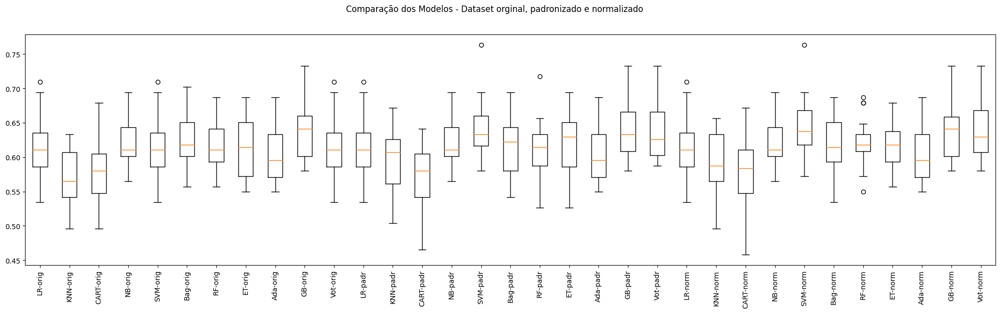

In [ ]:
# Chamando a função avalia_pipelines para a Eliminação Recursiva de Atributos
avalia_pipelines(X_train, y_train)

**Avaliando os dados gerados com Importância de Atributos com ExtraTrees**

Para os dados selecionados utilizando a Importância de Atributos com ExtraTrees, na execução para o modelo o algoritmo Extra Trees alcançou o melhor resultado atingindo 68,0%, mesmo quando normalizamos e padronizamos os dados, o algoritmo Extra Trees não melhorou a acurácia. Ficando em segundo lugar o SVM que atingiu 67,7% para os dados normalizados

LR: 0.6099 (0.0448)
KNN: 0.5481 (0.0350)
CART: 0.5721 (0.0499)
NB: 0.6195 (0.0343)
SVM: 0.6099 (0.0448)
Bagging: 0.6687 (0.0337)
RF: 0.6649 (0.0330)
ET: 0.6805 (0.0315)
Ada: 0.5931 (0.0383)
GB: 0.6454 (0.0238)
Voting: 0.6099 (0.0448)


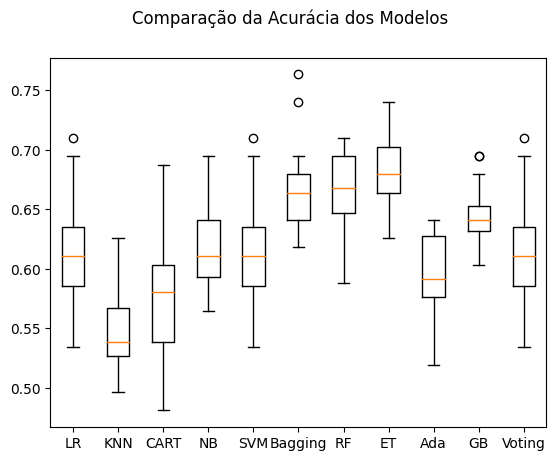

In [ ]:
# Separação em conjunto de treino e conjunto de teste com holdout utilizando Importância de Atributos com ExtraTrees
X_train, X_test, y_train, y_test = train_test_split(X_selected_IAE, water_potability_y_target, test_size=percentual_teste, random_state=semente) # faz a divisão

# Chamando a função avalia_modelo com o conjunto de treino
avalia_modelo(X_train, y_train)

LR-orig: 0.6099 (0.0448)
KNN-orig: 0.5481 (0.0350)
CART-orig: 0.5721 (0.0499)
NB-orig: 0.6195 (0.0343)
SVM-orig: 0.6099 (0.0448)
Bag-orig: 0.6687 (0.0337)
RF-orig: 0.6649 (0.0330)
ET-orig: 0.6805 (0.0315)
Ada-orig: 0.5931 (0.0383)
GB-orig: 0.6454 (0.0238)
Vot-orig: 0.6099 (0.0448)
LR-padr: 0.6099 (0.0448)
KNN-padr: 0.6206 (0.0454)
CART-padr: 0.5729 (0.0447)
NB-padr: 0.6191 (0.0346)
SVM-padr: 0.6798 (0.0367)
Bag-padr: 0.6641 (0.0332)
RF-padr: 0.6706 (0.0328)
ET-padr: 0.6698 (0.0443)
Ada-padr: 0.5931 (0.0383)
GB-padr: 0.6462 (0.0238)
Vot-padr: 0.6641 (0.0393)
LR-norm: 0.6099 (0.0448)
KNN-norm: 0.6168 (0.0490)
CART-norm: 0.5737 (0.0436)
NB-norm: 0.6191 (0.0346)
SVM-norm: 0.6771 (0.0397)
Bag-norm: 0.6641 (0.0386)
RF-norm: 0.6718 (0.0338)
ET-norm: 0.6706 (0.0320)
Ada-norm: 0.5931 (0.0383)
GB-norm: 0.6458 (0.0241)
Vot-norm: 0.6603 (0.0429)


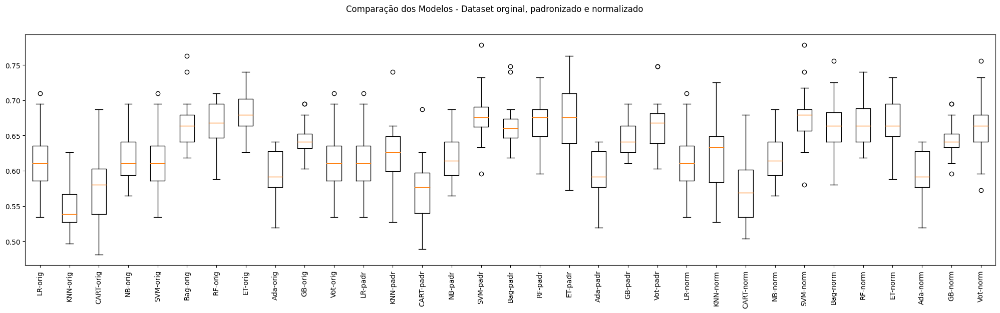

In [ ]:
# Chamando a função avalia_pipelines para Importância de Atributos com ExtraTrees
avalia_pipelines(X_train, y_train)

#### 4.2 Otimizando os hiperparâmetros

Com base nos resultados anteriores selecionei o terceiro resultado do feature selection que foi Importância de Atributos com ExtraTrees. Foi com ele que atingimos o melhor resultado após as analises acima. Algoritmo Extra Tree original e como o segundo melhor resultado foi com o algoritmo SVM normalizado também nesse mesmo conjunto de dados, vou explorar os hiperparâmetros também desse algoritmo

In [ ]:
# Tuning para o ExtraTree
np.random.seed(semente) # definindo uma semente global para este bloco

pipelines = []

# Definindo os componentes do pipeline
et = ('ET', ExtraTreesClassifier())
standard_scaler = ('StandardScaler', StandardScaler())
min_max_scaler = ('MinMaxScaler', MinMaxScaler())

pipelines = []
pipelines.append(('et-orig', Pipeline(steps=[et])))
pipelines.append(('et-padr', Pipeline(steps=[standard_scaler, et])))
pipelines.append(('et-norm', Pipeline(steps=[min_max_scaler, et])))

param_grid = {
    'ET__n_estimators': [50, 100],
    'ET__criterion': ['gini', 'entropy'],
    'ET__max_depth': [None, 10, 20],
    'ET__min_samples_split': [2, 5, 10],
    'ET__min_samples_leaf': [1, 2, 4],
}

# Prepara e executa o GridSearchCV
for name, model in pipelines:
    grid = GridSearchCV(estimator=model, param_grid=param_grid, scoring=scoring, cv=kfold)
    grid.fit(X_train, y_train)
    # imprime a melhor configuração
    print("Sem tratamento de missings: %s - Melhor: %f usando %s" % (name, grid.best_score_, grid.best_params_))


Sem tratamento de missings: et-orig - Melhor: 0.684351 usando {'ET__criterion': 'gini', 'ET__max_depth': None, 'ET__min_samples_leaf': 1, 'ET__min_samples_split': 10, 'ET__n_estimators': 50}
Sem tratamento de missings: et-padr - Melhor: 0.679771 usando {'ET__criterion': 'entropy', 'ET__max_depth': 20, 'ET__min_samples_leaf': 1, 'ET__min_samples_split': 5, 'ET__n_estimators': 100}
Sem tratamento de missings: et-norm - Melhor: 0.679771 usando {'ET__criterion': 'entropy', 'ET__max_depth': None, 'ET__min_samples_leaf': 1, 'ET__min_samples_split': 2, 'ET__n_estimators': 100}


In [ ]:
# Tuning para o SVC
np.random.seed(semente) # definindo uma semente global para este bloco

pipelines = []

# Definindo os componentes do pipeline
svc = ('SVC', SVC())
standard_scaler = ('StandardScaler', StandardScaler())
min_max_scaler = ('MinMaxScaler', MinMaxScaler())

pipelines = []
#pipelines.append(('svc-orig', Pipeline(steps=[svc])))
#pipelines.append(('svc-padr', Pipeline(steps=[standard_scaler, svc])))
pipelines.append(('svc-norm', Pipeline(steps=[min_max_scaler, svc])))

param_grid = {
    'SVC__C': [0.1, 1, 10],
    'SVC__kernel': ['linear', 'rbf'],
    'SVC__gamma': ['scale', 'auto']
}

# Prepara e executa o GridSearchCV
for name, model in pipelines:
    grid = GridSearchCV(estimator=model, param_grid=param_grid, scoring=scoring, cv=kfold)
    grid.fit(X_train, y_train)
    # imprime a melhor configuração
    print("Sem tratamento de missings: %s - Melhor: %f usando %s" % (name, grid.best_score_, grid.best_params_))

Sem tratamento de missings: svc-norm - Melhor: 0.677099 usando {'SVC__C': 1, 'SVC__gamma': 'scale', 'SVC__kernel': 'rbf'}


#### 4.3 Testando o modelo

Podemos observar que realmente o Extra Tree com os dados originais obteve a melhor acurácia, sendo assim faremos uma avaliação desse modelo com todos os dados de teste

Apenas lembrando que no ítem 4.1 quando avaliamos os modelos, a ultima separação de dados entre treino e testes foi realizada com os dados do ExtraTree, desta forma não será necessário separar novamente.

In [ ]:
# Criando um modelo com os parâmetros especificados
model = ExtraTreesClassifier(criterion='gini',
                             max_depth=None,
                             min_samples_leaf=1,
                             min_samples_split=10,
                             n_estimators=50)

model.fit(X_train, y_train)  # Treinando o modelo com todo o conjunto de treino
predictions = model.predict(X_test)  # Fazendo as predições com o conjunto de teste
print(accuracy_score(y_test, predictions))  # Estimando a acurácia no conjunto de teste

0.6615853658536586


Ao final chegamos a uma acurácia de 65,7% quando submetemos os dados a essa configuração de modelo.

#### 4.3 Novos Dados

Para finalizar farei uma simulação com dados novos ainda não submetidos ao modelo

In [ ]:
# Preparação do modelo com TODO o dataset
scaler = StandardScaler().fit(X_selected_IAE) # ajuste do scaler com TODO o dataset
rescaledX = scaler.transform(X_selected_IAE) # aplicação da padronização com TODO o dataset
model.fit(rescaledX, water_potability_y_target)

ExtraTreesClassifier(min_samples_split=10, n_estimators=50)

In [ ]:
# Novos dados - não sabemos a classe!
data = {'ph':  [6, 6, 0],
        'Dureza': [90, 150, 450],
        'Solidos': [14625, 5000, 12258],
        'Cloraminas': [7, 7, 9],
        'Sulfato': [300, 333, 340],
        'Condutividade': [500, 390, 425],
        'Carbono Orgânico': [12, 9, 15],
        'Trialometanos': [59, 28, 90],
        'Turbidez': [3.5, 2, 5],
        }

colunas = ['ph', 'Dureza', 'Solidos', 'Cloraminas', 'Sulfato', 'Condutividade', 'Carbono Orgânico', 'Trialometanos', 'Turbidez']
entrada = pd.DataFrame(data, columns=colunas)

array_entrada = entrada.values
X_entrada = array_entrada[:,0:9].astype(float)

# Padronização nos dados de entrada usando o scaler utilizado em X
rescaledEntradaX = scaler.transform(X_entrada)
print(rescaledEntradaX)

[[-0.763 -3.345 -0.853 -0.072 -0.976  0.929 -0.694 -0.485 -0.604]
 [-0.763 -1.457 -1.994 -0.072 -0.024 -0.448 -1.609 -2.494 -2.551]
 [-5.014  7.981 -1.134  1.24   0.178 -0.01   0.22   1.525  1.343]]


In [ ]:
# Predição de classes dos dados de entrada
saidas = model.predict(rescaledEntradaX)
print(saidas)

[0. 1. 0.]


#MVP de Machine Learning & Analytics (**Segunda Parte**)

Este trabalho é referente a segunda parte do MVP da segunda sprint (Machine Learning & Analytics) do curso de Pós-Graduação em Ciência de Dados e Analytics da PUC-RJ.

Nele será treinado um modelo baseado em Deep Learning para resolver um problema de visão computacional, iniciando na carga e preparação dos dados, incluindo a separação entre treino e teste, modelagem, otimização de hiperparâmetros, até a avaliação e comparação de resultados dos modelos treinados.

Para acessar apenas ao notebook contendo a segunda parte utilizar o link:
https://github.com/JGCMachado/Notebooks/blob/49d8fabb76dae95a66cb672520de01d6e9b2c30c/MVP2_Chest_XRay_3classes.ipynb

##1.0 Diagnóstico da Pneumonia - Definição do problema

A pneumonia é uma doença respiratória grave que afeta milhões de pessoas em todo o mundo, sendo uma das principais causas de problemas de saúde e mortalidade, especialmente em crianças, idosos e pessoas com sistemas imunológicos enfraquecidos. A pneumonia pode ser causada por bactérias, vírus ou fungos, e seus sintomas incluem tosse, febre, dificuldade respiratória e dor no peito.

O diagnóstico precoce e preciso da pneumonia é muito importante na prevenção de complicações graves e na melhoria dos resultados de tratamento. Um diagnóstico rápido permite que os profissionais de saúde iniciem o tratamento adequado, seja com antibióticos para pneumonia bacteriana ou terapia antiviral para pneumonia viral, reduzindo assim o risco de complicações e mortes.

A proposta desse trabalho consistem em treinar um modelo capaz de identificar através de uma radiografia de tórax se a aparência dos pulmões está normal ou se apresenta indícios de pneumonia bacteriana ou viral.

In [ ]:
# Importação da imagem
from IPython.display import Image
Image(url='https://raw.githubusercontent.com/JGCMachado/Imagens/main/chestxray.jpg')

O  conjunto de imagens desse trabalho foi adaptado do Kaggle "Chest X-Ray Images (Pneumonia)". O conjunto original é separado em dois diretórios, um  contendo imagens com diagnósticos normais e outro com imagens de diagnósticos de pneumonia e o desafio é identificar as 2 classes.

Como o diretório com imagens de diagnóstico de pneumonia contem arquivos com nomes que podem ser separados em pneumonia bacteriana ou viral, optei por criar as 3 classes.

As imagens originais podem ser encontradas no endereço abaixo:

https://www.kaggle.com/datasets/paultimothymooney/chest-xray-pneumonia



In [ ]:
!pip install gdown

In [ ]:
from keras.preprocessing.image import ImageDataGenerator
from keras import layers
from keras import models
from keras import optimizers
from tensorflow.keras.preprocessing import image
from tensorflow.keras import regularizers
import os
from sklearn.model_selection import train_test_split
import shutil
import random
import math
import numpy as np
import zipfile
import pandas as pd
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from datetime import datetime
from tensorflow import keras
from sklearn.metrics import confusion_matrix, classification_report
import sklearn.metrics as skm
import itertools
import numpy as np
import matplotlib.pyplot as plt
import gdown

In [ ]:
# configuração para não exibir os warnings
import warnings
warnings.filterwarnings("ignore")

**Definição de funções**

Aqui é definida a função para gerar a matriz de confusão que será utilizada durante o trabalho

In [ ]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    Esta função imprime e plota a matriz de confusão.
    A normalização pode ser aplicada definindo `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Matriz de confusão normalizada")
    else:
        print('Matriz de confusão sem normalização')
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('Label real')
    plt.xlabel('Label predição')

##2.0 Preparação dos dados

Para poder trabalhar com 3 classes ao invés de apenas as 2 originais selecionei 1200 imagens de cada uma das classes, os arquivos foram renomeados e serão trabalhados a partir de um unico diretório

Devido ao tamanho, o arquivo está disponível não no Github mas no Google Drive. Ele será baixado, descompactado e tratado no próprio ambiente do Colab durante a execução do trabalho.

Após a descompactação faremos uma verificação do numero de imagens que foram descompactadas no diretório destino e veremos os nomes dos 20 primeiros arquivos


In [ ]:
# Path onde se encontra o arquivo 'train3classes.zip'
file_id = '1g2VtBkiHZPa3nu7ODBgfHbXj4moN4DN4'
url = f"https://drive.google.com/uc?id={file_id}"
output = "train3classes.zip"
gdown.download(url, output)

Downloading...
From: https://drive.google.com/uc?id=1g2VtBkiHZPa3nu7ODBgfHbXj4moN4DN4
To: /content/train3classes.zip
100%|██████████| 949M/949M [00:09<00:00, 102MB/s]


'train3classes.zip'

In [ ]:
# Criando a pasta de destino onde serão descompactados os arquivos do 'train3classes.zip'
train = 'train3classes.zip'
destination = 'datasets/chest/train3classes/'

os.makedirs(destination,exist_ok=True)

with zipfile.ZipFile(train,'r') as zip_ref:
    zip_ref.extractall(destination)

In [ ]:
# Mostrando o total de arquivos descompactados no diretório
print(f"Temos um total de {len(os.listdir(destination))} imagens para o treinamento e avaliação do modelo de deep learning")

Temos um total de 3600 imagens para o treinamento e avaliação do modelo de deep learning


In [ ]:
# Mostrando o nome dos 20 primeiros arquivos
print(f"Primeiras 20 imagens: \n {os.listdir(destination)[:20]}")

Primeiras 20 imagens: 
 ['virus (805).jpeg', 'normal (1126).jpeg', 'virus (667).jpeg', 'virus (558).jpeg', 'normal (1110).jpeg', 'virus (694).jpeg', 'virus (6).jpeg', 'normal (329).jpeg', 'normal (1173).jpeg', 'normal (1087).jpeg', 'bacteria (1085).jpeg', 'normal (434).jpeg', 'virus (1022).jpeg', 'virus (677).jpeg', 'bacteria (1153).jpeg', 'bacteria (369).jpeg', 'bacteria (36).jpeg', 'virus (1001).jpeg', 'normal (260).jpeg', 'normal (333).jpeg']


### 2.1 Carga das imagens e definição das classes

Faremos agora a cargas dos metadados das imagens em um dataset e definiremos a classe através do nome do arquivo da imagem. Elas serão classificadas em "normal", "bacteria" e "virus"

Veremos os primeiros registros do dataset e um gráfico com o balanceamento entre as classes

In [ ]:
images =os.listdir(destination)

labels, heights, widths, channels, filesize = [], [], [], [], []

# Loop que percorre cada uma das imagens extraídas
for fname in images:

    classe = str(fname)[:5]
    if classe == 'norma':
       labels.append('normal')
    elif classe == 'virus':
       labels.append('virus')
    else:
       labels.append('bacteria')

    img_shape = mpimg.imread(destination+fname).shape
    heights.append(img_shape[0])
    widths.append(img_shape[1])
    if len(img_shape) > 2:
       channels.append(img_shape[2])
    else:
       channels.append(2)  # Definindo um valor padrão para canais se não houver a terceira dimensão
    filesize.append(os.path.getsize(destination+fname))

# Criação do dataset
chest_xray = pd.DataFrame({'images': images, 'class': labels, 'height': heights,
                         'width': widths, 'channels': channels, 'filesize': filesize})

In [ ]:
chest_xray.head()

,images,class,height,width,channels,filesize
0,virus (805).jpeg,virus,543,854,3,36418
1,normal (1126).jpeg,normal,1028,1304,2,404220
2,virus (667).jpeg,virus,1056,1448,2,111670
3,virus (558).jpeg,virus,670,928,3,74504
4,normal (1110).jpeg,normal,1136,1230,2,437091


In [ ]:
chest_xray.count()

images      3600
class       3600
height      3600
width       3600
channels    3600
filesize    3600
dtype: int64

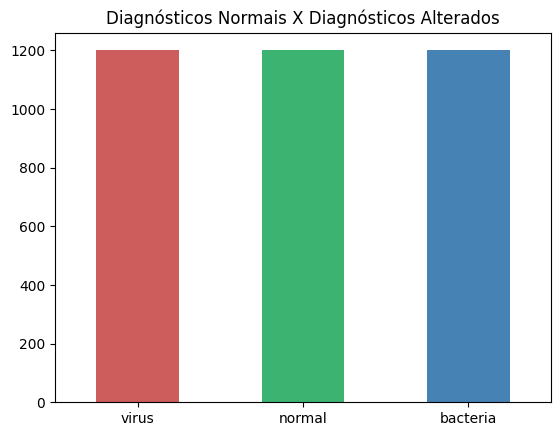

In [ ]:
# Obtendo os valores e as contagens das classes
class_counts = chest_xray['class'].value_counts()

# Definindo as cores para cada classe
colors = ['indianred',  'mediumseagreen', 'steelblue']

# Criando o gráfico
fig, ax = plt.subplots()
class_counts.plot(kind='bar', color=colors, ax=ax)
ax.set_title('Diagnósticos Normais X Diagnósticos Alterados')
ax.set_xticklabels(class_counts.index, rotation=0)

# Exibindo o gráfico
plt.show()

### 2.2 Exemplo de algumas imagens

Visualizaremos a seguir 12 imagens aleatórias do diretório

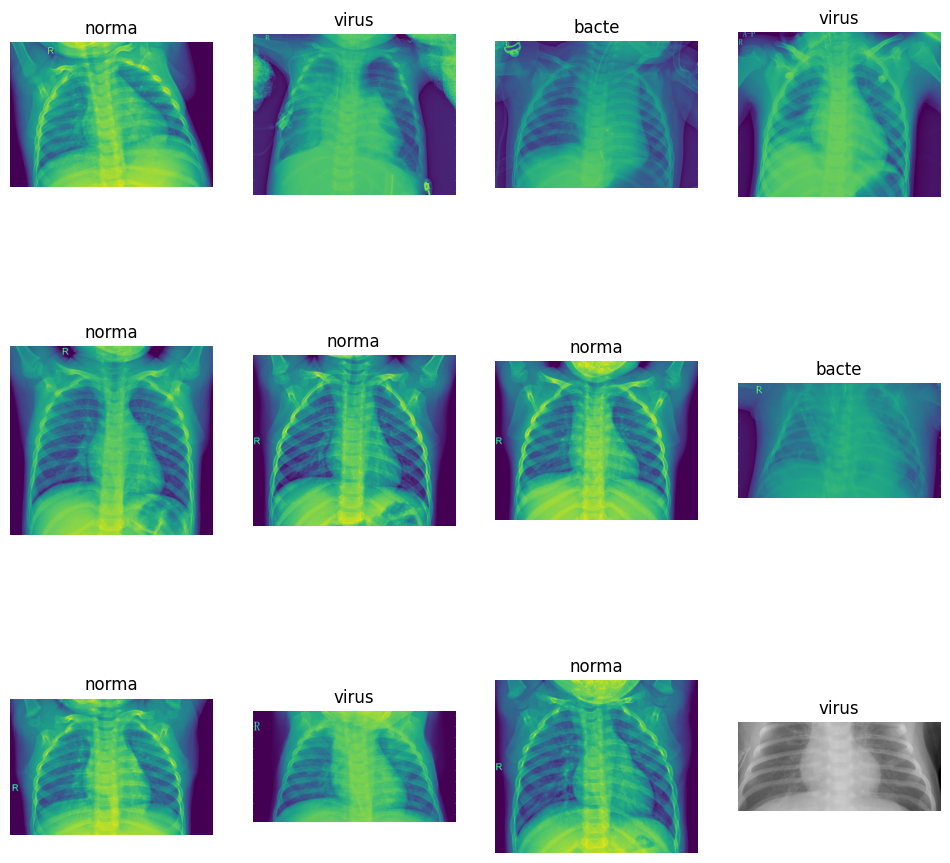

In [ ]:
fig = plt.gcf()
fig.set_size_inches(3*4, 3*4)

# Visualizando as imagens
for i in range(12):

    sample = np.random.choice(images)
    img_path =destination+sample
    sp = plt.subplot(3, 4, i + 1)
    sp.axis('Off')
    img = mpimg.imread(img_path)
    plt.imshow(img)
    plt.title(sample[:5])

plt.show()

### 2.3 Separação em dados de treino e de teste

Os dados serão divididos em 30% para teste e 70% para treino do modelo

In [ ]:
train, test =train_test_split(chest_xray[['images' , 'class']] ,test_size=0.3 ,random_state=9 , shuffle=True)

In [ ]:
print("##### Train: #####")
print(train)
print("##### Test: #####")
print(test)

##### Train: #####
                   images     class
258   bacteria (129).jpeg  bacteria
1917     virus (608).jpeg     virus
2320  bacteria (290).jpeg  bacteria
2298  bacteria (162).jpeg  bacteria
3361  bacteria (821).jpeg  bacteria
...                   ...       ...
2104     virus (241).jpeg     virus
501   bacteria (999).jpeg  bacteria
2686     virus (361).jpeg     virus
348      virus (988).jpeg     virus
382   bacteria (124).jpeg  bacteria

[2520 rows x 2 columns]
##### Test: #####
                   images     class
185     virus (1019).jpeg     virus
119    normal (1111).jpeg    normal
3332    virus (1003).jpeg     virus
2426  bacteria (608).jpeg  bacteria
716      virus (373).jpeg     virus
...                   ...       ...
2319   bacteria (10).jpeg  bacteria
1469    normal (588).jpeg    normal
1452   normal (1041).jpeg    normal
2228    normal (884).jpeg    normal
2831    normal (649).jpeg    normal

[1080 rows x 2 columns]


### 2.4 Aumentando o numero de imagens

Utilizaremos a classe ImageDataGenerator do TensorFlow para gerar novas imagens baseadas nas imagens originais. O ImageDataGeneretor tem por finalidade gerar imagens aumentadas e em outros angulos (data argumentation).

Abaixo são definidos alguns parametros utilizado pelo ImageDataGenerator. Realizei varios testes variando o batch size (30, 50, 80 e 100) e o tamanho das imagens (100, 150, 250, 350, 450, 500, 600 e 700 ) para chegar em valores onde eu tivesse uma imagem maior para facilitar o aprendizado mas que coubece dentro do tamanho de memória disponível no Colab. Tamanhos maiores de imagens ou batch size esgotavam a memória do ambiente.

Os tamanhos abaixo foram os tamanhos onde eu consegui a melhor relação para o tamanho de imagem para processar dentro do tempo disponível. Comentarei sobre esses valores novamente ao final do trabalho

In [ ]:
# Definição dos parametros para o ImageDataGenerator
batch_size = 80
img_height = 150
img_width = 150
num_classes = 3

In [ ]:
train_datagen=ImageDataGenerator(validation_split=0.2, #include validation split
                                 rescale = 1.0/255,
                                    rotation_range=40,
                                    shear_range=0.2,
                                    zoom_range=0.2,
                                    horizontal_flip=True,
                                    fill_mode='nearest')

test_datagen=ImageDataGenerator(rescale=1./255)


train_generator=train_datagen.flow_from_dataframe(
    train ,destination,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    x_col='images',
    y_col='class',
    subset='training' #training set
    )

val_generator=train_datagen.flow_from_dataframe(
    train ,destination,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    x_col='images',
    y_col='class',
    subset='validation' #validation set
    )

test_generator=test_datagen.flow_from_dataframe(
    test ,destination,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    x_col='images',
    y_col='class',)

Found 2016 validated image filenames belonging to 3 classes.
Found 504 validated image filenames belonging to 3 classes.
Found 1080 validated image filenames belonging to 3 classes.


Mostrando exemplos de alterações geradas pelo ImageDataGenerator em cima de uma unica imagem real.

Found 1 validated image filenames belonging to 1 classes.


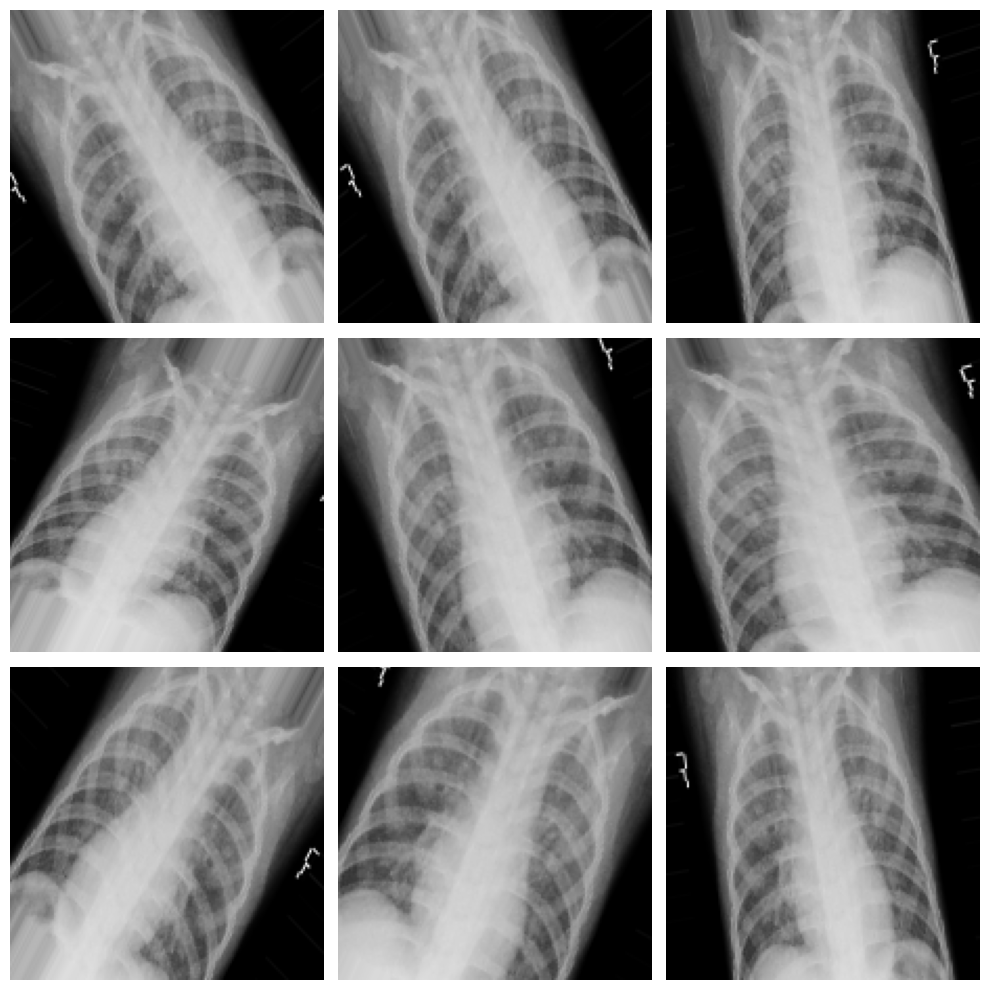

In [ ]:
# Pegando um registro do dataframe
sample = chest_xray.sample(n=1)

# Neste caso o tipo de classe é categorico, pois temos um exemplo com apenas uma classe
sample_generator = train_datagen.flow_from_dataframe(
    sample,
    destination,
    x_col='images',
    y_col='class',
    target_size=(img_height, img_width),
    class_mode='categorical'
)

plt.figure(figsize=(10, 10))
for i in range(9):
    plt.subplot(3, 3, i+1)
    for x_batch, y_batch in sample_generator:
        image = x_batch[0]
        plt.imshow(image)
        plt.axis('Off')
        break
plt.tight_layout()
plt.show()

##3.0 Arquiteturas testadas

Durante a realização deste trabalho muitas arquiteturas foram testadas e retestadas de forma exaustiva e ficaria difícial a cada alteração de parâmetro ter um registro.

Nesse ítem 3 vou dar uma passada em algumas arquiteturas testadas registrando a evolução alcançada ao longo do ultmo mes. Durante esse tempo não só a definição da arquitetura e o treinamento do modelo (variando o numero de epocas para até 100) foram executados mas também a execução do modelo treinado junto as imagens de teste e toda a avaliação.

Neste ítem, por questão de tempo e recursos disponíveis no Colab utilizarei apenas 5 epocas para ilustrar o trabalhho realizado

No ítem 4 executarei na integra todos os passos utilizando a arquitetura selecionada.

### 3.1 Definição e treinamento das Arquiteturas

**Primeira Arquitetura**

Iniciei os testes com uma arquitetura mais simples composta de 4 camadas de convolução e pooling com numero crescente de filtros, todas com função de ativação ReLu para extrair características relevantes. Após cada uma delas tem uma camada de pooling para reduzir a dimensionalidade.

Na segunda parte da arquitetura antes de cada camada densa coloquei uma camada de dropout para evitar o overfitting.

A função ReLu é uma das funções de ativação mais utilizadas em redes neurais e deep learning.

In [ ]:
model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(img_height, img_width, 3 )))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(128 , (3,3) , activation='relu'))
model.add(layers.MaxPooling2D( (2,2)))

model.add(layers.Conv2D(128 , (3,3) , activation='relu'))
model.add(layers.MaxPooling2D( (2,2)))

In [ ]:
model.add(layers.Flatten() )
model.add(layers.Dropout(0.25))
model.add(layers.Dense( 512 ,activation='relu' ))
model.add(layers.Dropout(0.25))
model.add(layers.Dense( num_classes, activation='softmax' ) )

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 74, 74, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 36, 36, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 17, 17, 128)      0

In [ ]:
model.compile(optimizer='adam', loss='categorical_crossentropy' , metrics=['accuracy'])

In [ ]:
history=model.fit(train_generator ,
                  epochs=5 ,
                  validation_data=val_generator)

Epoch 1/5
26/26 [==============================] - 94s 4s/step - loss: 1.1134 - accuracy: 0.3532 - val_loss: 1.1025 - val_accuracy: 0.3353
Epoch 2/5
26/26 [==============================] - 90s 3s/step - loss: 1.0990 - accuracy: 0.3591 - val_loss: 1.0941 - val_accuracy: 0.3353
Epoch 3/5
26/26 [==============================] - 91s 3s/step - loss: 1.0922 - accuracy: 0.3904 - val_loss: 1.0622 - val_accuracy: 0.4266
Epoch 4/5
26/26 [==============================] - 90s 3s/step - loss: 1.0275 - accuracy: 0.4514 - val_loss: 0.9770 - val_accuracy: 0.5218
Epoch 5/5
26/26 [==============================] - 90s 3s/step - loss: 0.9291 - accuracy: 0.5159 - val_loss: 0.8171 - val_accuracy: 0.5853


**Segunda Arquitetura**

Para a segunda arquitetura registrada aqui no trabalho variei apenas o numero de filtros das camadas e consegui um resultado bem melhor que o primeiro porém com a execução para um numero maior de epocas foi aumentando o overfitting

In [ ]:
model = models.Sequential()
model.add(layers.Conv2D(64, (3, 3), activation='relu', input_shape=(img_height, img_width, 3 )))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(256 , (3,3) , activation='relu'))
model.add(layers.MaxPooling2D( (2,2)))

model.add(layers.Conv2D(128 , (3,3) , activation='relu'))
model.add(layers.MaxPooling2D( (2,2)))

In [ ]:
model.add(layers.Flatten() )
model.add(layers.Dropout(0.25))
model.add(layers.Dense( 1024 ,activation='relu' ))
model.add(layers.Dropout(0.25))
model.add(layers.Dense( num_classes, activation='softmax' ) )

In [ ]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 148, 148, 64)      1792      
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 74, 74, 64)       0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 72, 72, 128)       73856     
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 36, 36, 128)      0         
 2D)                                                             
                                                                 
 conv2d_6 (Conv2D)           (None, 34, 34, 256)       295168    
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 17, 17, 256)     

In [ ]:
model.compile(optimizer='adam', loss='categorical_crossentropy' , metrics=['accuracy'])

In [ ]:
history=model.fit(train_generator ,
                  epochs=5 ,
                  validation_data=val_generator)

Epoch 1/5
26/26 [==============================] - 209s 8s/step - loss: 1.1256 - accuracy: 0.3507 - val_loss: 1.0820 - val_accuracy: 0.4683
Epoch 2/5
26/26 [==============================] - 200s 8s/step - loss: 1.0816 - accuracy: 0.4018 - val_loss: 1.0849 - val_accuracy: 0.3790
Epoch 3/5
26/26 [==============================] - 205s 8s/step - loss: 1.0651 - accuracy: 0.4241 - val_loss: 0.9962 - val_accuracy: 0.5198
Epoch 4/5
26/26 [==============================] - 199s 8s/step - loss: 0.9752 - accuracy: 0.5144 - val_loss: 1.0068 - val_accuracy: 0.5278
Epoch 5/5
26/26 [==============================] - 200s 8s/step - loss: 0.8694 - accuracy: 0.5843 - val_loss: 0.7653 - val_accuracy: 0.6448


**Terceira Arquitetura**

Para essa terceira arquitetura testei a função de ativação da Tangente Hiperbólica (tanh) em 2 camadas convolucionais. O resultado foi melhor que os anteriores mesmo com o numero de filtros menor que a Segunda Arquitetura.

In [ ]:
model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(img_height, img_width, 3 )))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(64, (3, 3), activation='tanh'))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(128 , (3,3) , activation='relu'))
model.add(layers.MaxPooling2D( (2,2)))

model.add(layers.Conv2D(128 , (3,3) , activation='tanh'))
model.add(layers.MaxPooling2D( (2,2)))

In [ ]:
model.add(layers.Flatten() )
model.add(layers.Dropout(0.25))
model.add(layers.Dense( 512, activation='relu' ))
model.add(layers.Dropout(0.25))
model.add(layers.Dense( num_classes, activation='softmax' ) )

In [ ]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_8 (Conv2D)           (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 74, 74, 32)       0         
 2D)                                                             
                                                                 
 conv2d_9 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 36, 36, 64)       0         
 2D)                                                             
                                                                 
 conv2d_10 (Conv2D)          (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_10 (MaxPoolin  (None, 17, 17, 128)     

In [ ]:
model.compile(optimizer='adam', loss='categorical_crossentropy' , metrics=['accuracy'])

In [ ]:
history=model.fit(train_generator ,
                  epochs=5 ,
                  validation_data=val_generator)

Epoch 1/5
26/26 [==============================] - 100s 4s/step - loss: 1.1465 - accuracy: 0.3909 - val_loss: 1.0491 - val_accuracy: 0.4881
Epoch 2/5
26/26 [==============================] - 91s 3s/step - loss: 1.0207 - accuracy: 0.4886 - val_loss: 0.9724 - val_accuracy: 0.5179
Epoch 3/5
26/26 [==============================] - 91s 3s/step - loss: 0.8839 - accuracy: 0.5699 - val_loss: 0.8431 - val_accuracy: 0.5873
Epoch 4/5
26/26 [==============================] - 92s 3s/step - loss: 0.8271 - accuracy: 0.5878 - val_loss: 0.7468 - val_accuracy: 0.6627
Epoch 5/5
26/26 [==============================] - 93s 3s/step - loss: 0.7362 - accuracy: 0.6434 - val_loss: 0.6536 - val_accuracy: 0.6825


**Arquitetura Final**

Por fim cheguei a arquitetura abaixo onde volto a iniciar a primeira camada com 32 filtros e ao longo das novas camadas utilizo novas funções de ativação como a PRelu e a Leaky ReLu. Na camanda densa aumento o percentual do Dropout para 0.30 e na execução integral consagui controlar melhor o overfitting. Com essa nova configuração variada de funções de ativação entendi que tinha atingido um resultado satisfatório. Falarei mais sobre o resultado ao final do trabalho em minhas considerações.

In [ ]:
model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(img_height, img_width, 3 )))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(128, (3, 3)))
model.add(layers.PReLU(alpha_initializer='zeros'))  # Definindo o alpha_initializer para inicializar o parâmetro de inclinação aprendível
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(256, (3, 3), activation='tanh'))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(256, (3, 3), activation='relu', kernel_regularizer=regularizers.l2(0.01)))
model.add(layers.MaxPooling2D((2, 2)))


In [ ]:
model.add(layers.Flatten())
model.add(layers.Dropout(0.30))
model.add(layers.Dense(1024, activation='relu', kernel_regularizer=regularizers.l2(0.01) ))
model.add(layers.PReLU(alpha_initializer='zeros'))  # Definindo o alpha_initializer para inicializar o parâmetro de inclinação aprendível
model.add(layers.Dense(512))
model.add(layers.Dropout(0.30))
model.add(layers.Dense(num_classes, activation='softmax'))

In [ ]:
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_12 (Conv2D)          (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d_12 (MaxPoolin  (None, 74, 74, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_13 (Conv2D)          (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_13 (MaxPoolin  (None, 36, 36, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_14 (Conv2D)          (None, 34, 34, 128)       73856     
                                                                 
 p_re_lu (PReLU)             (None, 34, 34, 128)      

In [ ]:
model.compile(optimizer='adam', loss='categorical_crossentropy' , metrics=['accuracy'])

In [ ]:
history=model.fit(train_generator ,
                  epochs=5 ,
                  validation_data=val_generator)

Epoch 1/5
26/26 [==============================] - 114s 4s/step - loss: 7.9039 - accuracy: 0.3333 - val_loss: 3.5507 - val_accuracy: 0.3353
Epoch 2/5
26/26 [==============================] - 100s 4s/step - loss: 2.1628 - accuracy: 0.4489 - val_loss: 1.2786 - val_accuracy: 0.5159
Epoch 3/5
26/26 [==============================] - 101s 4s/step - loss: 1.1014 - accuracy: 0.5064 - val_loss: 0.9762 - val_accuracy: 0.5417
Epoch 4/5
26/26 [==============================] - 101s 4s/step - loss: 0.9006 - accuracy: 0.5670 - val_loss: 0.9401 - val_accuracy: 0.5337
Epoch 5/5
26/26 [==============================] - 100s 4s/step - loss: 0.8475 - accuracy: 0.5823 - val_loss: 0.8321 - val_accuracy: 0.5536


##4.0 Execução final

Tendo em vista os processamentos acima darei sequencia utilizando a Terceira Arquitetura que nesse momento foi a que teve o melhor desempenho

### 4.1 Treinamento do modelo final para 20 Epocas

In [ ]:
model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(img_height, img_width, 3 )))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(64, (3, 3), activation='tanh'))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(128 , (3,3) , activation='relu'))
model.add(layers.MaxPooling2D( (2,2)))

model.add(layers.Conv2D(128 , (3,3) , activation='tanh'))
model.add(layers.MaxPooling2D( (2,2)))

In [ ]:
model.add(layers.Flatten() )
model.add(layers.Dropout(0.25))
model.add(layers.Dense( 512, activation='relu' ))
model.add(layers.Dropout(0.25))
model.add(layers.Dense( num_classes, activation='softmax' ) )

In [ ]:
model.compile(optimizer='adam', loss='categorical_crossentropy' , metrics=['accuracy'])

In [ ]:
history=model.fit(train_generator ,
                  epochs=20 ,
                  validation_data=val_generator)

Epoch 1/20
26/26 [==============================] - 94s 4s/step - loss: 1.2529 - accuracy: 0.3775 - val_loss: 1.0590 - val_accuracy: 0.4762
Epoch 2/20
26/26 [==============================] - 92s 4s/step - loss: 1.0242 - accuracy: 0.4628 - val_loss: 1.0381 - val_accuracy: 0.4702
Epoch 3/20
26/26 [==============================] - 91s 3s/step - loss: 1.0758 - accuracy: 0.4082 - val_loss: 1.0280 - val_accuracy: 0.5099
Epoch 4/20
26/26 [==============================] - 92s 4s/step - loss: 0.9541 - accuracy: 0.5491 - val_loss: 0.8672 - val_accuracy: 0.5972
Epoch 5/20
26/26 [==============================] - 91s 3s/step - loss: 0.8476 - accuracy: 0.5967 - val_loss: 0.8225 - val_accuracy: 0.5833
Epoch 6/20
26/26 [==============================] - 91s 3s/step - loss: 0.7719 - accuracy: 0.6136 - val_loss: 0.6749 - val_accuracy: 0.6825
Epoch 7/20
26/26 [==============================] - 91s 3s/step - loss: 0.7706 - accuracy: 0.6404 - val_loss: 0.7158 - val_accuracy: 0.6488
Epoch 8/20
26/26 [==

### 4.2 Execução do modelo para as imagens de teste

3/3 [==============================] - 1s 242ms/step


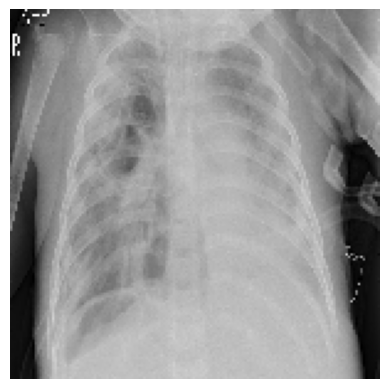

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.5870108


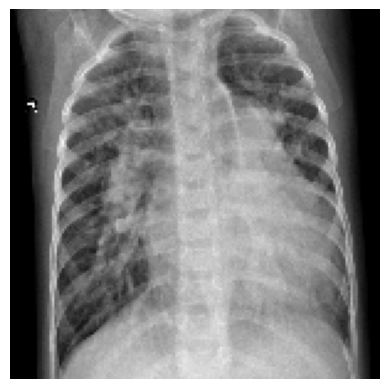

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.66603726


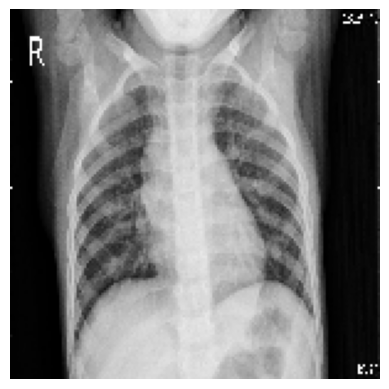

Label:  virus
Previsão:  normal
Probabilidade:  0.8760807


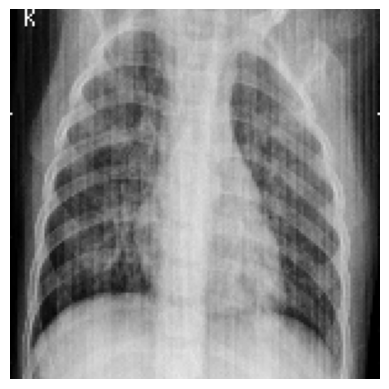

Label:  virus
Previsão:  normal
Probabilidade:  0.46940604


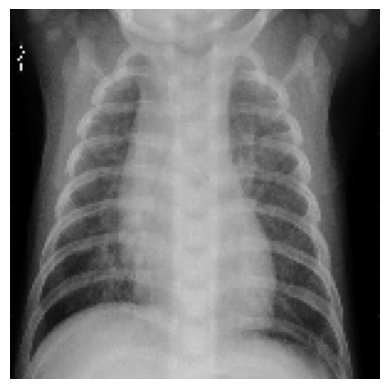

Label:  virus
Previsão:  virus
Probabilidade:  0.52415913


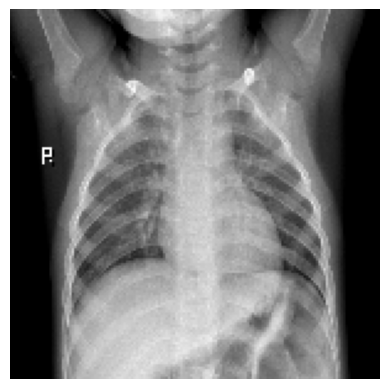

Label:  normal
Previsão:  normal
Probabilidade:  0.99578744


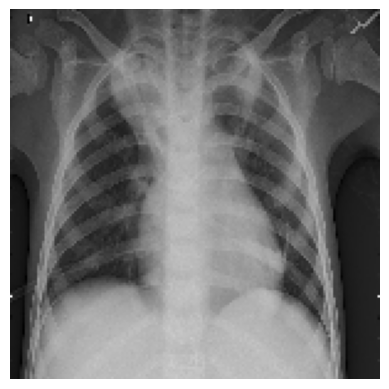

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.589284


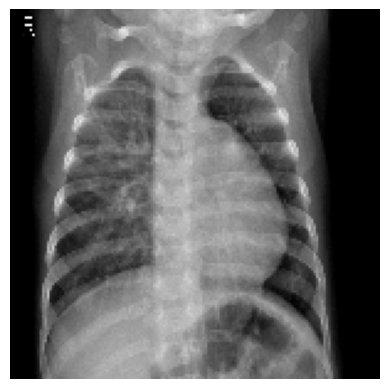

Label:  virus
Previsão:  normal
Probabilidade:  0.7293715


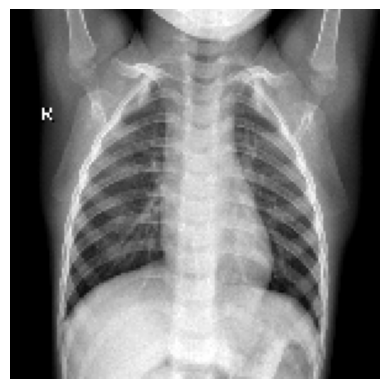

Label:  normal
Previsão:  normal
Probabilidade:  0.99457085


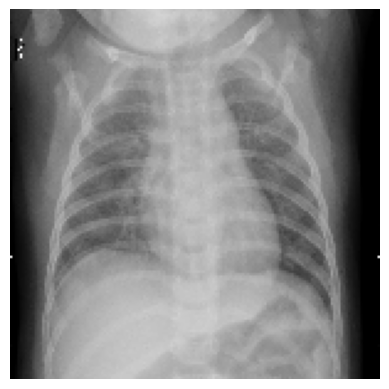

Label:  virus
Previsão:  bacteria
Probabilidade:  0.42316338


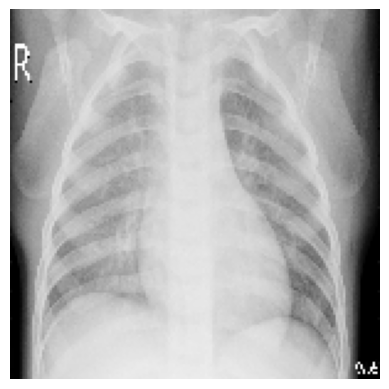

Label:  bacteria
Previsão:  virus
Probabilidade:  0.4976119


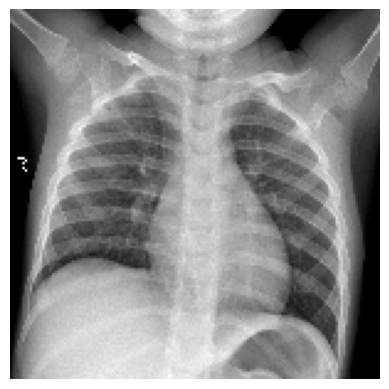

Label:  normal
Previsão:  normal
Probabilidade:  0.9947172


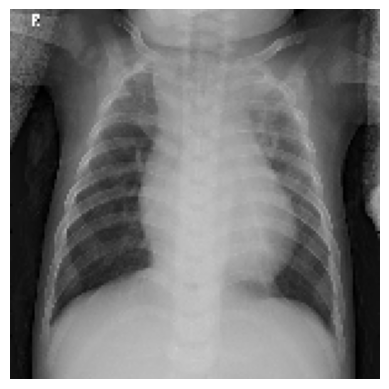

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.7463959


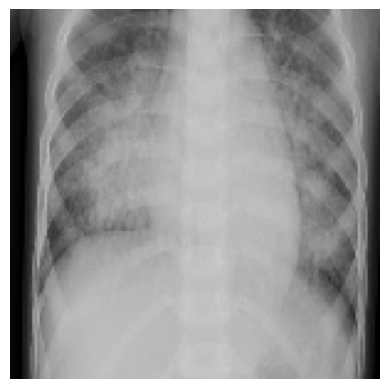

Label:  bacteria
Previsão:  virus
Probabilidade:  0.50233227


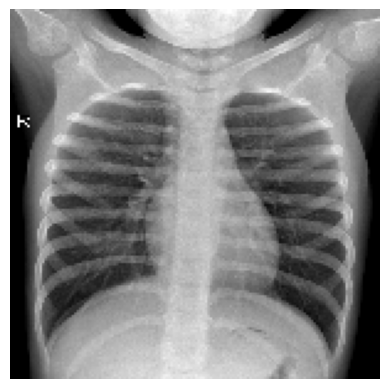

Label:  normal
Previsão:  normal
Probabilidade:  0.99574953


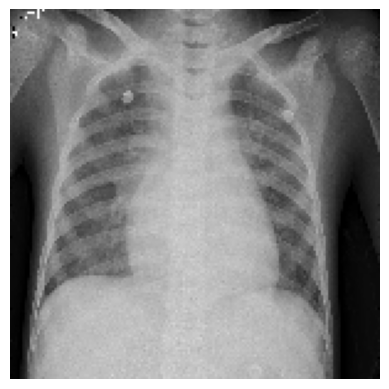

Label:  virus
Previsão:  bacteria
Probabilidade:  0.57369787


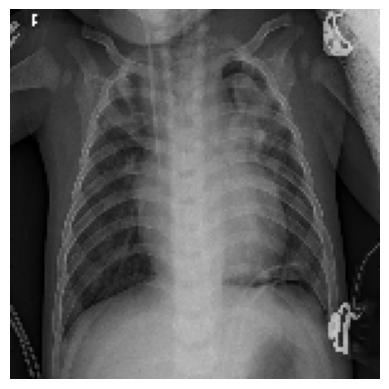

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.8944641


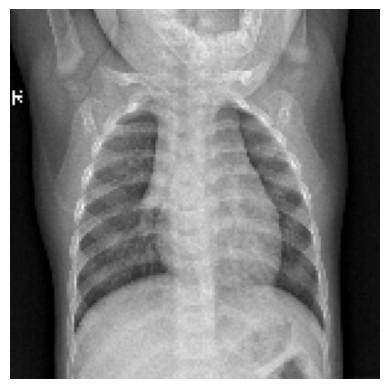

Label:  normal
Previsão:  normal
Probabilidade:  0.98495716


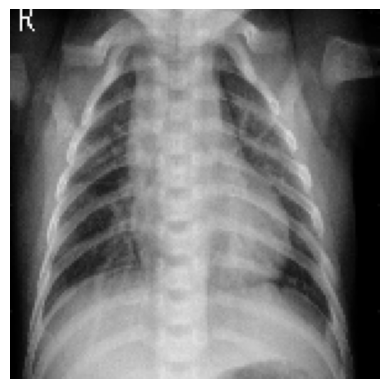

Label:  virus
Previsão:  bacteria
Probabilidade:  0.48029


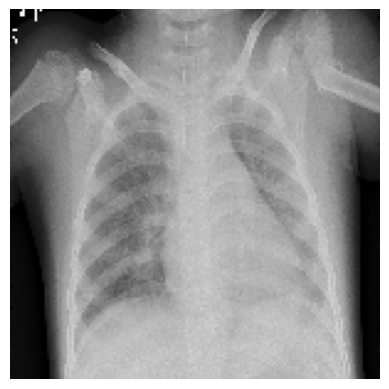

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.36680764


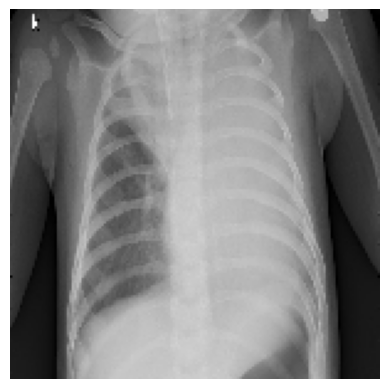

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.641063


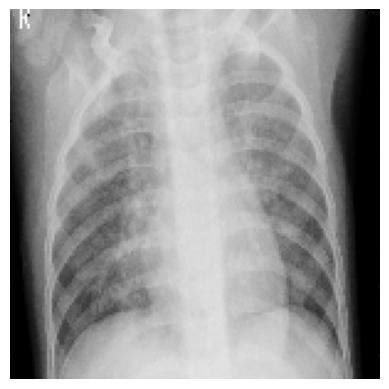

Label:  bacteria
Previsão:  virus
Probabilidade:  0.5025705


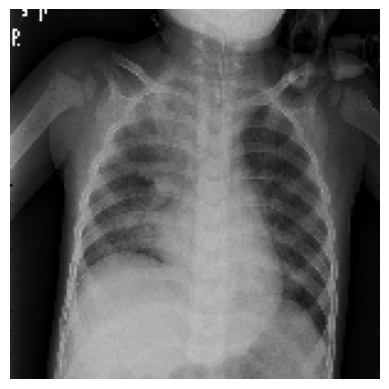

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.39989385


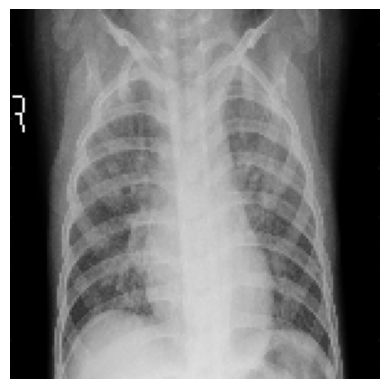

Label:  bacteria
Previsão:  virus
Probabilidade:  0.6677562


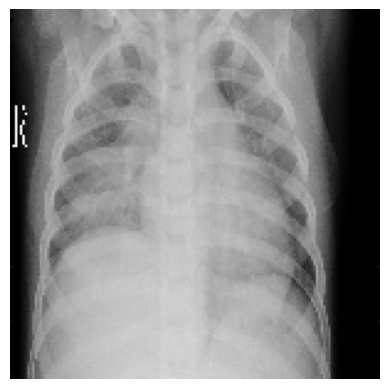

Label:  bacteria
Previsão:  virus
Probabilidade:  0.5094418


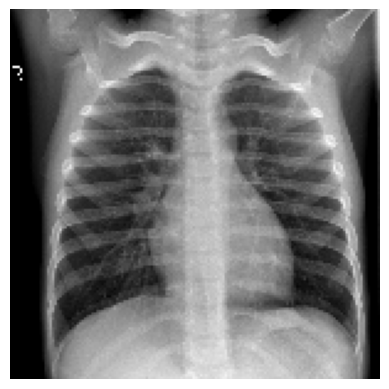

Label:  normal
Previsão:  normal
Probabilidade:  0.97682536


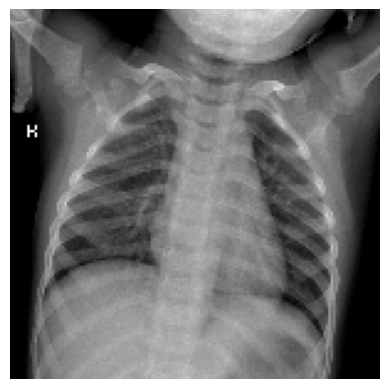

Label:  normal
Previsão:  normal
Probabilidade:  0.99025255


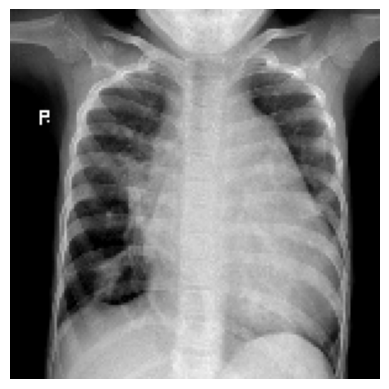

Label:  virus
Previsão:  bacteria
Probabilidade:  0.42286295


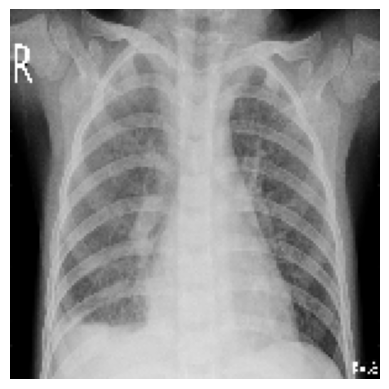

Label:  virus
Previsão:  virus
Probabilidade:  0.5154694


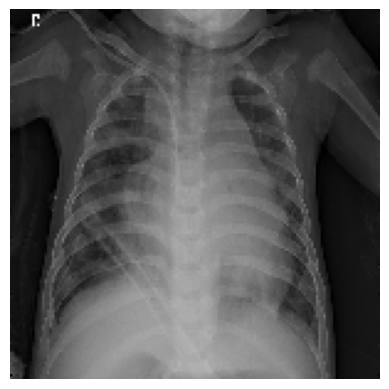

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.8115364


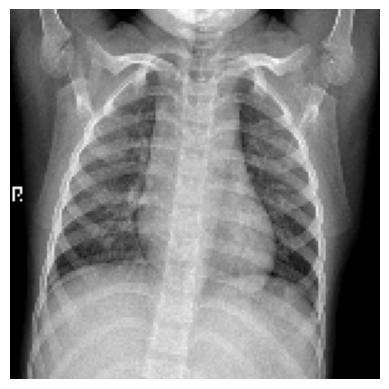

Label:  normal
Previsão:  normal
Probabilidade:  0.9806932


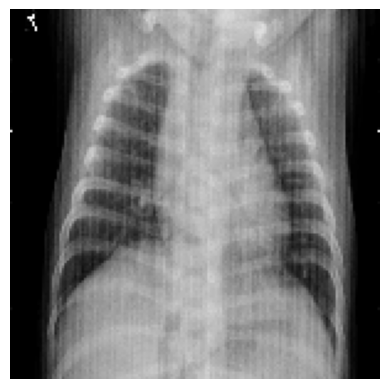

Label:  virus
Previsão:  normal
Probabilidade:  0.5800626


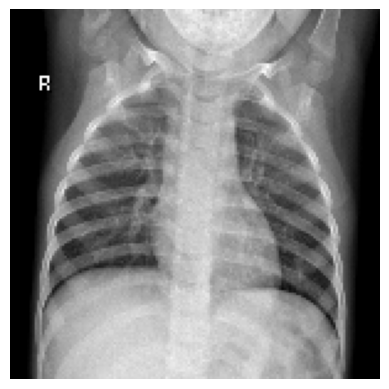

Label:  normal
Previsão:  normal
Probabilidade:  0.99613374


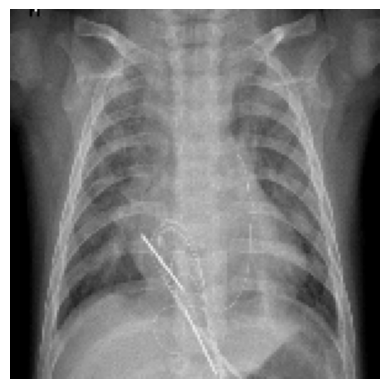

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.59394276


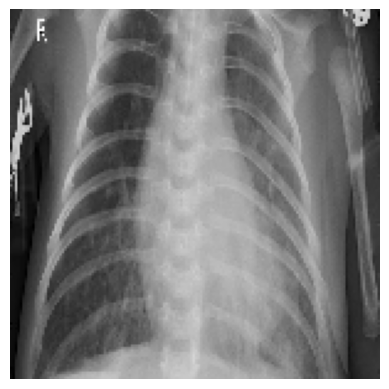

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.7370481


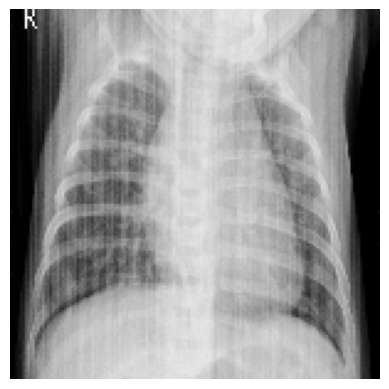

Label:  virus
Previsão:  virus
Probabilidade:  0.6547021


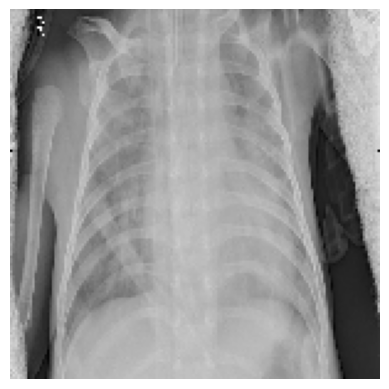

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.73220456


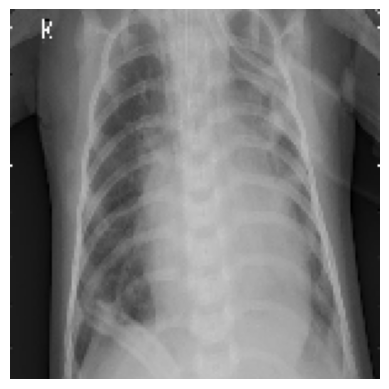

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.6704449


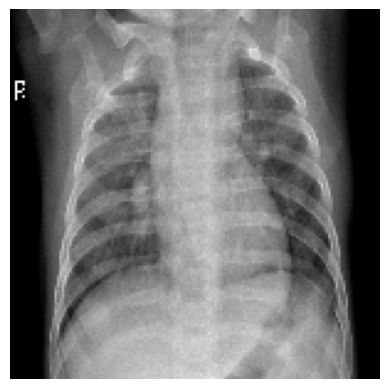

Label:  virus
Previsão:  normal
Probabilidade:  0.7131787


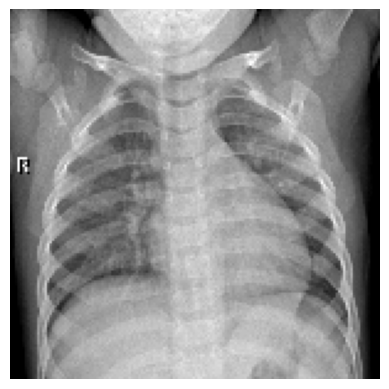

Label:  normal
Previsão:  normal
Probabilidade:  0.98521656


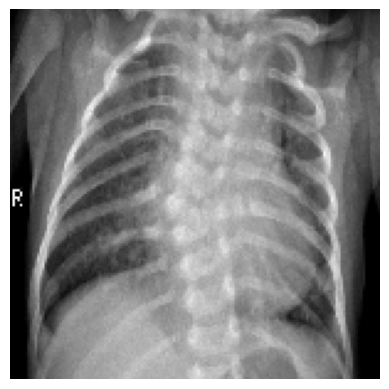

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.5900365


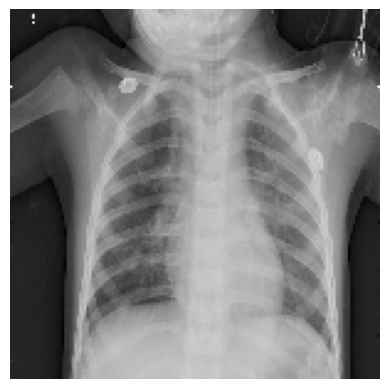

Label:  bacteria
Previsão:  normal
Probabilidade:  0.88440067


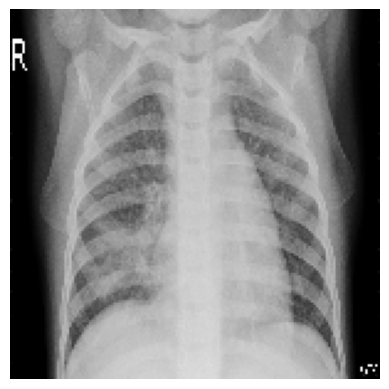

Label:  virus
Previsão:  virus
Probabilidade:  0.7026518


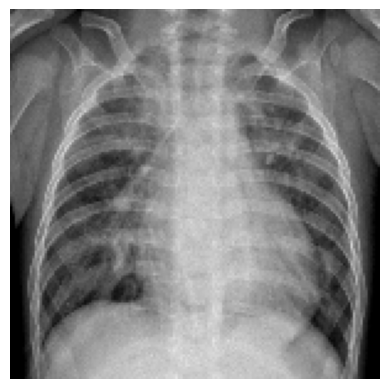

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.7101094


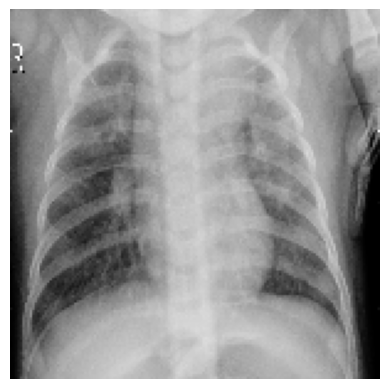

Label:  bacteria
Previsão:  virus
Probabilidade:  0.40103176


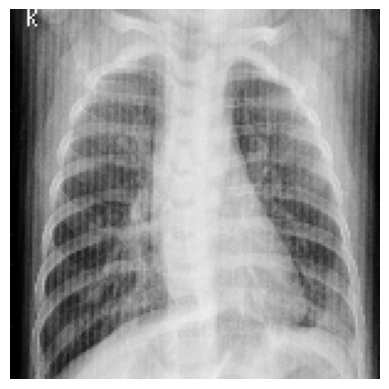

Label:  virus
Previsão:  virus
Probabilidade:  0.5120709


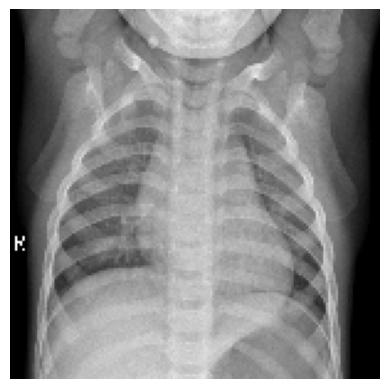

Label:  normal
Previsão:  normal
Probabilidade:  0.9830105


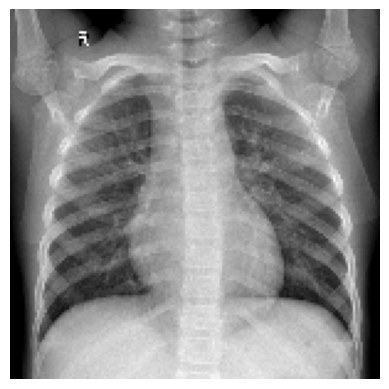

Label:  normal
Previsão:  normal
Probabilidade:  0.9281369


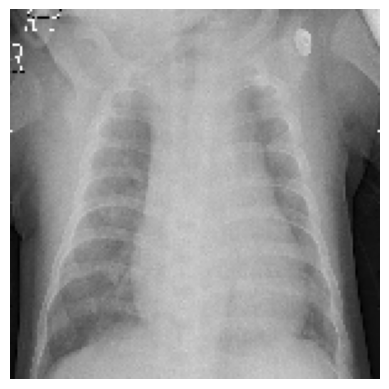

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.7045086


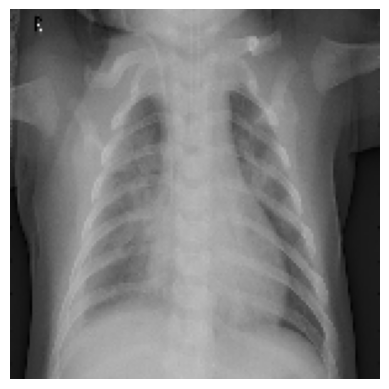

Label:  virus
Previsão:  bacteria
Probabilidade:  0.5858388


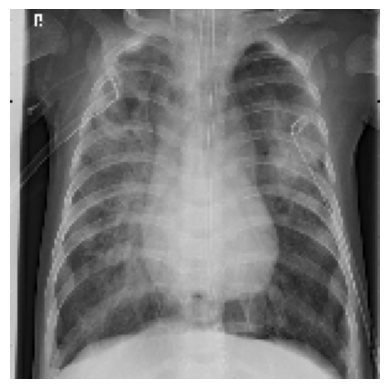

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.8111873


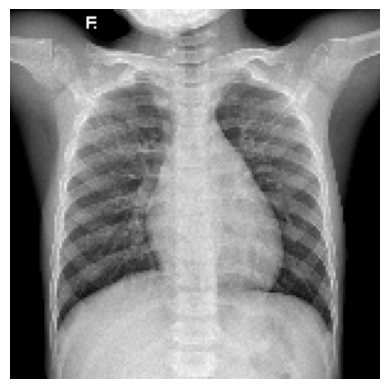

Label:  normal
Previsão:  normal
Probabilidade:  0.9886642


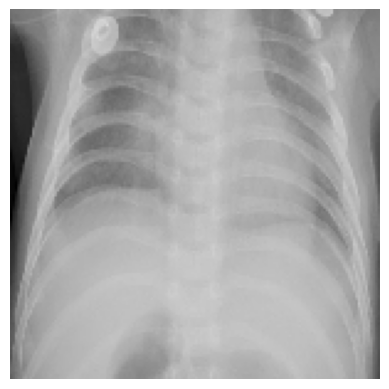

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.5090717


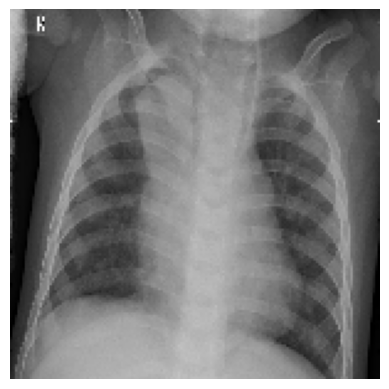

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.68314064


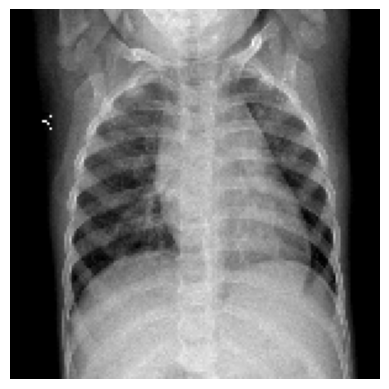

Label:  normal
Previsão:  normal
Probabilidade:  0.79760283


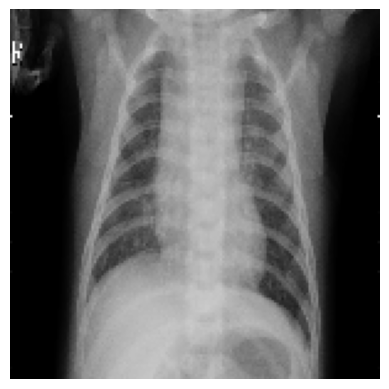

Label:  virus
Previsão:  virus
Probabilidade:  0.6635519


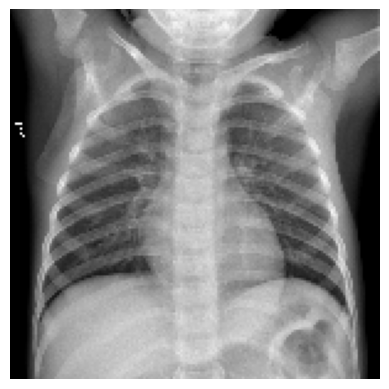

Label:  normal
Previsão:  normal
Probabilidade:  0.98677415


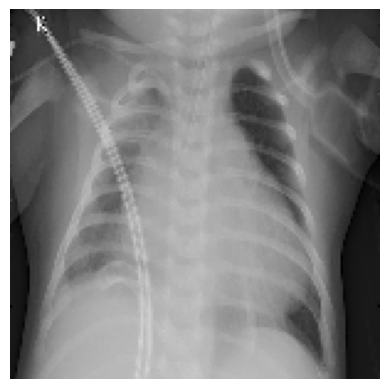

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.69703484


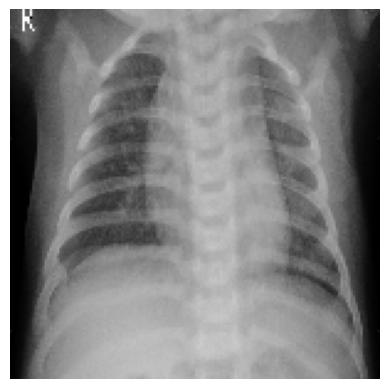

Label:  virus
Previsão:  bacteria
Probabilidade:  0.499356


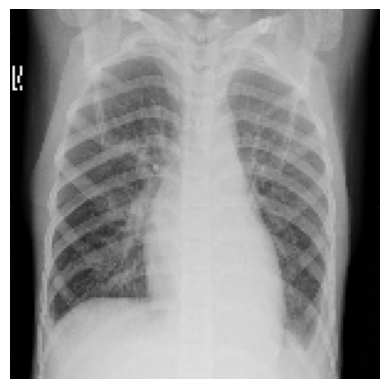

Label:  bacteria
Previsão:  virus
Probabilidade:  0.5951569


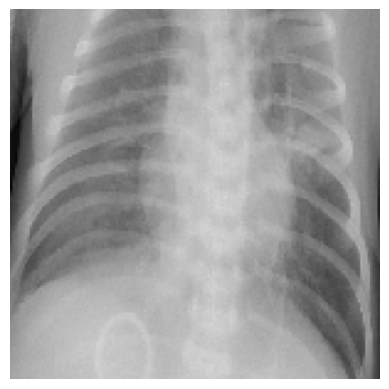

Label:  virus
Previsão:  bacteria
Probabilidade:  0.5143966


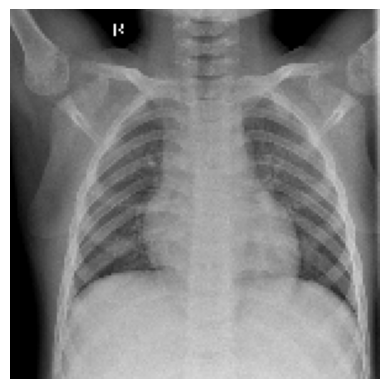

Label:  normal
Previsão:  normal
Probabilidade:  0.9769928


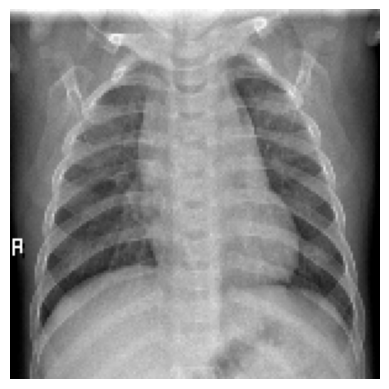

Label:  normal
Previsão:  normal
Probabilidade:  0.91945285


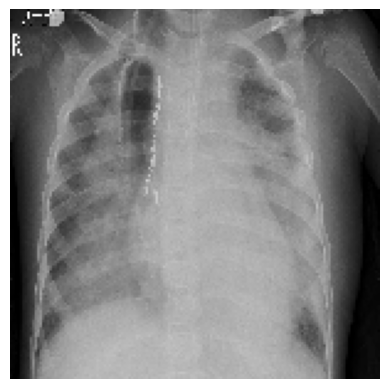

Label:  virus
Previsão:  bacteria
Probabilidade:  0.5791241


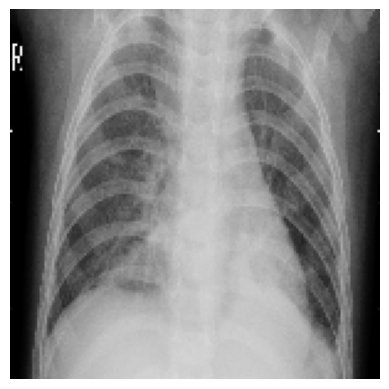

Label:  virus
Previsão:  virus
Probabilidade:  0.4778519


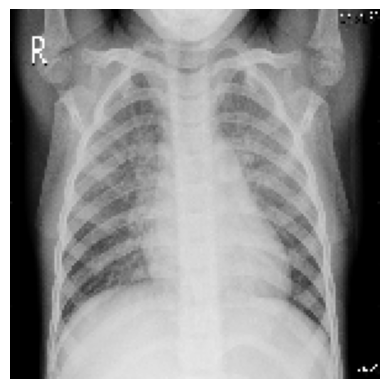

Label:  virus
Previsão:  normal
Probabilidade:  0.5288268


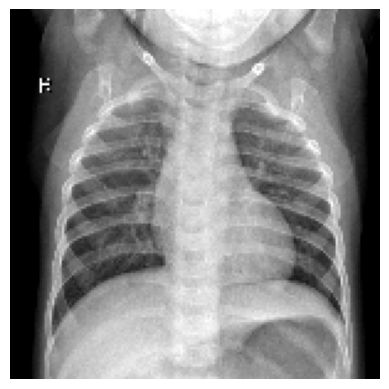

Label:  normal
Previsão:  normal
Probabilidade:  0.99739987


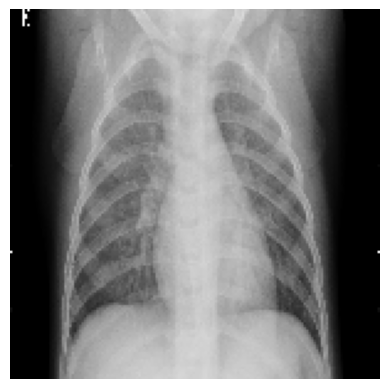

Label:  bacteria
Previsão:  virus
Probabilidade:  0.58714336


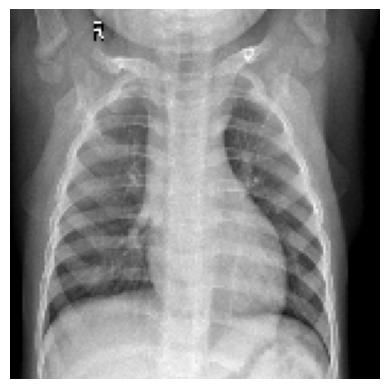

Label:  normal
Previsão:  normal
Probabilidade:  0.9652418


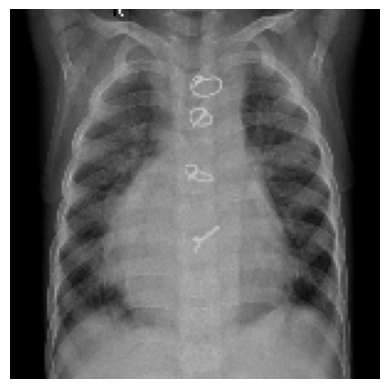

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.55527425


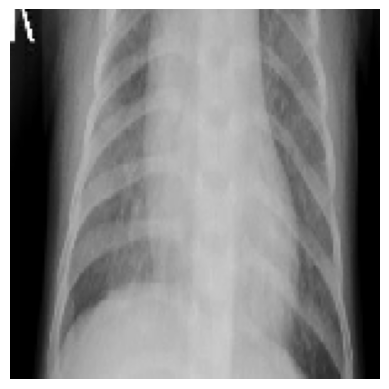

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.52709574


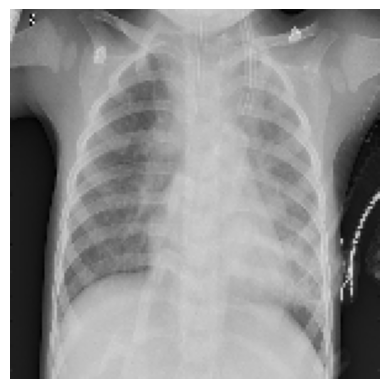

Label:  virus
Previsão:  bacteria
Probabilidade:  0.55263054


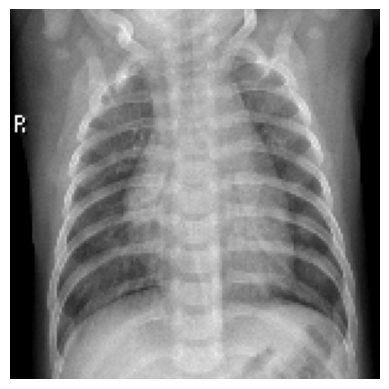

Label:  virus
Previsão:  normal
Probabilidade:  0.5884162


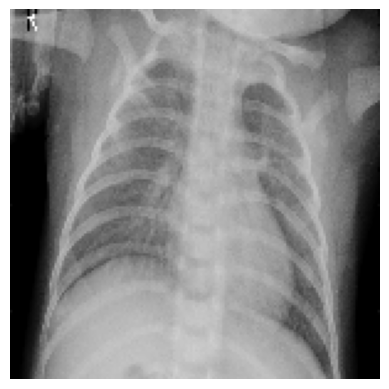

Label:  virus
Previsão:  bacteria
Probabilidade:  0.41532987


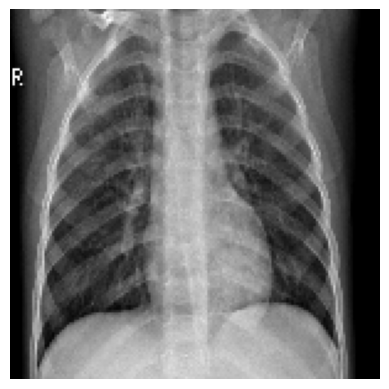

Label:  virus
Previsão:  normal
Probabilidade:  0.6646147


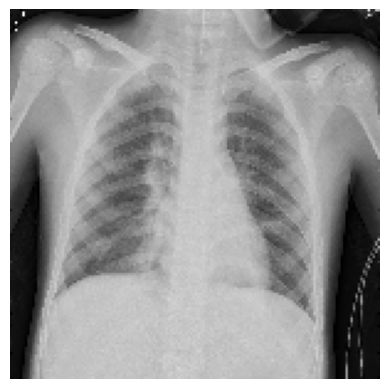

Label:  bacteria
Previsão:  normal
Probabilidade:  0.7872225


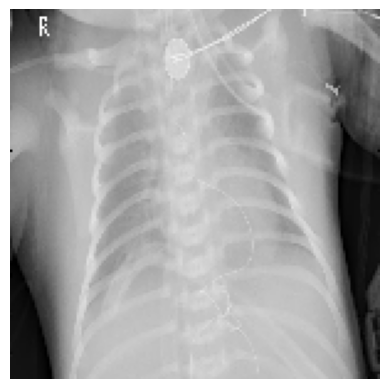

Label:  virus
Previsão:  bacteria
Probabilidade:  0.60936016


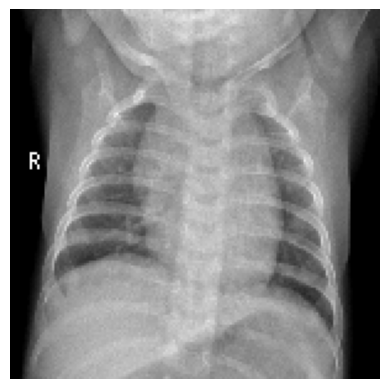

Label:  normal
Previsão:  normal
Probabilidade:  0.932018


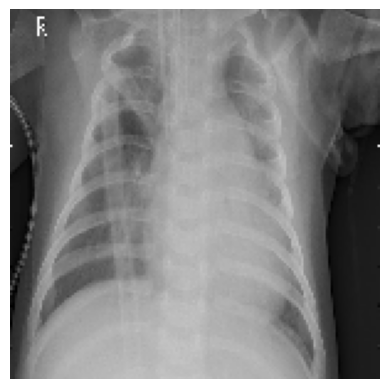

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.6057942


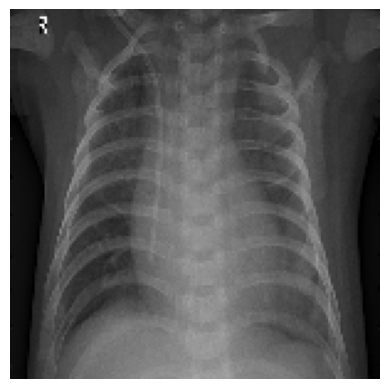

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.7633887


In [ ]:
count = 0
y_pred = list()
y_true = list()
class_names = ['bacteria',
               'normal',
               'virus']

# Loop do data generator de teste que contem as imagens
for batch in test_generator:

    count+=1

    # Condição de saída do loop. Só executaremos o modelo em algumas imagens
    if count == 2:
        break

    else:

        # Pegando a imagem e o label
        images = batch[0]
        labels = batch[1]

        # Previsão
        predictions = model.predict(images)

        # Visualização da imagem
        for i in range(len(images)):

            image = images[i]
            label = labels[i]
            prediction = predictions[i]

            # Converte o array de previsão para visualizar a classe e a probabilidade
            predicted_class = np.argmax(prediction)
            probability = prediction[predicted_class]
            class_name = class_names[int(predicted_class)]

            if (label == [1., 0., 0.]).all():
                real = "bacteria"
            elif (label == [0., 1., 0.]).all():
                real = "normal"
            else:
                real = "virus"

            y_true.append(real)
            y_pred.append(class_name)

            # Configura a saída das imagens que serão visualizadas
            plt.imshow(images[i])
            plt.axis('Off')
            plt.show()

            # Imprime os resultados da classificação das images
            print("Label: ", real)
            print("Previsão: ", class_name)
            print("Probabilidade: ", probability)

### 4.3 Verificação das metricas alcançadas

Ao final, o modelo atingiu uma acertividade no teste em torno de 66% levando em consideração a acurácia, a precisão, o recall e o F1-Score, mais a frente  veremos que essa taxa chega a 73% quando verificada com uma quantidade maior de imagens, demonstrando um desempenho ainda mais promissor.

In [ ]:
loss, accuracy = model.evaluate(test_generator)
print("Test: accuracy = %f  ;  loss = %f " % (accuracy, loss))

14/14 [==============================] - 19s 1s/step - loss: 0.6548 - accuracy: 0.6907
Test: accuracy = 0.690741  ;  loss = 0.654792 


In [ ]:
accuracy = skm.accuracy_score(y_true, y_pred)
precision = skm.precision_score(y_true, y_pred, average='weighted')
recall = skm.recall_score(y_true, y_pred, average='weighted')
f1score = skm.f1_score(y_true, y_pred, average='weighted')

print("Accuracy: ", accuracy)
print("Precision: ", precision)
print("Recall: ", recall)
print("F1 Score: ", f1score)

Accuracy:  0.6375
Precision:  0.6097619047619047
Recall:  0.6375
F1 Score:  0.606627783669141


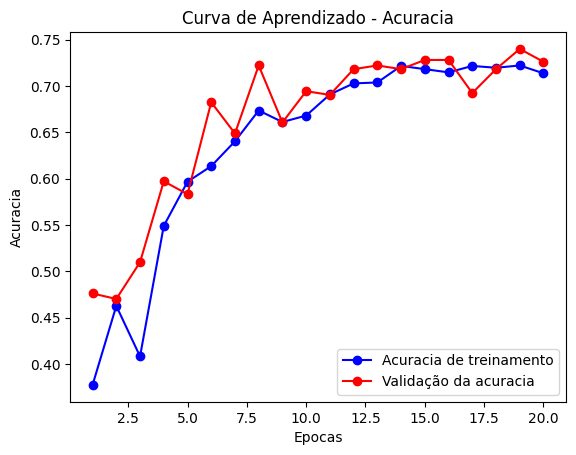

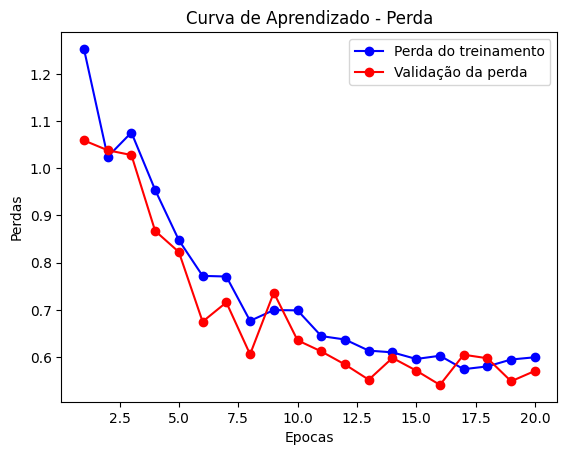

In [ ]:
# Grafico da curva de aprendizado
train_acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Plot the learning curve
epochs = range(1, len(train_acc) + 1)
plt.plot(epochs, train_acc, 'bo-', label='Acuracia de treinamento')
plt.plot(epochs, val_acc, 'ro-', label='Validação da acuracia')
plt.title('Curva de Aprendizado - Acuracia')
plt.xlabel('Epocas')
plt.ylabel('Acuracia')
plt.legend()
plt.show()

plt.plot(epochs, train_loss, 'bo-', label='Perda do treinamento')
plt.plot(epochs, val_loss, 'ro-', label='Validação da perda')
plt.title('Curva de Aprendizado - Perda')
plt.xlabel('Epocas')
plt.ylabel('Perdas')
plt.legend()
plt.show()

Matriz de confusão sem normalização


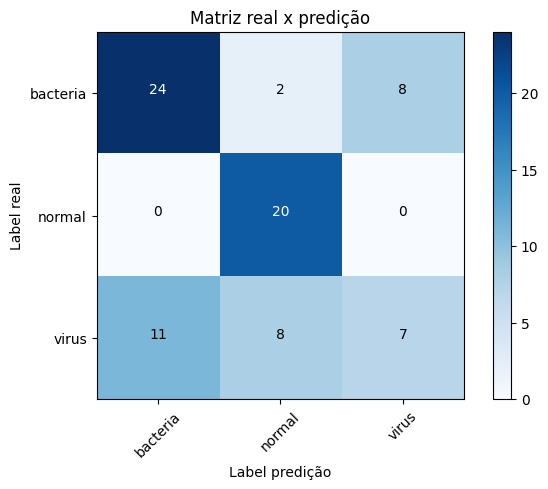

In [ ]:
cnf_matrix = confusion_matrix(y_true, y_pred, labels=class_names)
np.set_printoptions(precision=2)

plt.figure()
plot_confusion_matrix(cnf_matrix,
                      classes=['bacteria',
                               'normal',
                              'virus'],
                      normalize= False,
                      title='Matriz real x predição')

##5.0 Salvando e Recuperando o modelo

Para que não seja necessário treinar o modelo todas as vezes que formos executar, vamos salvar essa ultima versão do modelo treinado e disponibiliza-la no Google Drive. Depois vamos carregar essa cópia previamente salva para continuar o trabalho


In [ ]:
# obtendo a data e hora atual
now = datetime.now()

# Definição do formato
formato = '%Y-%m-%dT%H%M'

# Converter a data e hora em uma string com o formato especificado
formatted_datetime = now.strftime(formato)

path_model = 'datasets/chest/trained_model'

name_model = 'trained_model_' + formatted_datetime + '.h5'

# salvando o modelo
model.save("%s/%s" % (path_model, name_model))
print("Modelo salvo com o nome: ", name_model)

Modelo salvo com o nome:  trained_model_2023-07-23T1425.h5


In [ ]:
# Realizando o download do modelo treinado
# Path onde se encontra o arquivo 'trained_model_chest_xray.h5'
file_id = '1djra-LXeozWTuccM-T7LOjiDMih80gqD'
url = f"https://drive.google.com/uc?id={file_id}"
path_model = 'datasets/chest/trained_model'
name_model = 'datasets/chest/trained_model/trained_model_chest_xray.h5'
gdown.download(url, name_model)

Downloading...
From: https://drive.google.com/uc?id=1djra-LXeozWTuccM-T7LOjiDMih80gqD
To: /content/datasets/chest/trained_model/trained_model_chest_xray.h5
100%|██████████| 41.5M/41.5M [00:01<00:00, 21.7MB/s]


'datasets/chest/trained_model/trained_model_chest_xray.h5'

In [ ]:
# Carregando o modelo treinado
name_model = 'trained_model_chest_xray.h5'
loaded_model = keras.models.load_model("%s/%s" % (path_model, name_model))
print("Modelo %s carregado com sucesso" % (name_model))

Modelo trained_model_chest_xray.h5 carregado com sucesso


##6.0 Testando o modelo salvo

Executaremos agora um teste com o modelo que foi recuperado utilizando uma quantidade maior de dados. Para esse teste não irei mostrar as imagens, apenas o resultado.

In [ ]:
count = 0
y_pred = list()
y_true = list()
class_names = ['bacteria',
               'normal',
               'virus']

# Loop do data generator de teste que contem as imagens
for batch in test_generator:

    count+=1

    #Condição de saída do loop. Só executaremos o modelo em algumas imagens
    if count == 15:
        break

    else:

        # Pegando a imagem e o label
        images = batch[0]
        labels = batch[1]

        # Previsão
        predictions = loaded_model.predict(images)

        # Visualização da imagem
        for i in range(len(images)):

            image = images[i]
            label = labels[i]
            prediction = predictions[i]

            # Converte o array de previsão para visualizar a classe e a probabilidade
            predicted_class = np.argmax(prediction)
            probability = prediction[predicted_class]
            class_name = class_names[int(predicted_class)]

            if (label == [1., 0., 0.]).all():
                real = "bacteria"
            elif (label == [0., 1., 0.]).all():
                real = "normal"
            else:
                real = "virus"

            y_true.append(real)
            y_pred.append(class_name)


3/3 [==============================] - 1s 202ms/step


Conforme mencionado anteriormente, com uma quantidade maior de imagens o modelo conseguiu uma performance ainda melhor atingindo uma acertividade em torno de 73%

In [ ]:
accuracy = skm.accuracy_score(y_true, y_pred)
precision = skm.precision_score(y_true, y_pred, average='weighted')
recall = skm.recall_score(y_true, y_pred, average='weighted')
f1score = skm.f1_score(y_true, y_pred, average='weighted')

print("Accuracy: ", accuracy)
print("Precision: ", precision)
print("Recall: ", recall)
print("F1 Score: ", f1score)

Accuracy:  0.7361111111111112
Precision:  0.7320020739619365
Recall:  0.7361111111111112
F1 Score:  0.7262523030019656


Matriz de confusão sem normalização


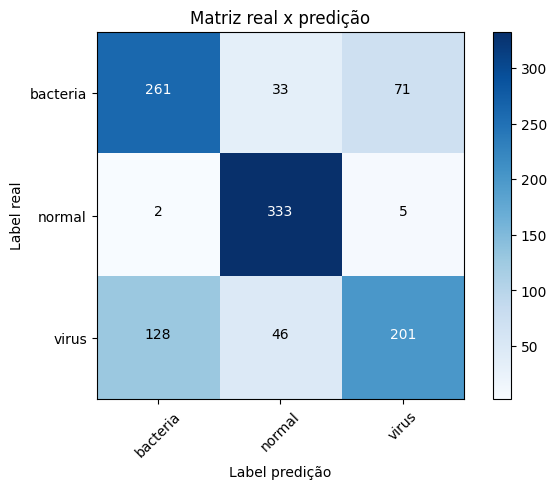

In [ ]:
cnf_matrix = confusion_matrix(y_true, y_pred, labels=class_names)
np.set_printoptions(precision=2)

plt.figure()
plot_confusion_matrix(cnf_matrix,
                      classes=['bacteria',
                               'normal',
                              'virus'],
                      normalize= False,
                      title='Matriz real x predição')

##7.0 Considerações finais

Inicialmente esse conjunto de imagens possuía apenas 2 classes, Normal ou Pneumonia. Implementei as 3 classes com instinto curioso de testar e explorar qual seria a reação do modelo treinado. Acredito que dentro das condições possíveis o modelo teve um desempenho muito bom. Podemos ver claramente que ele identifica bem os casos Normais, mas demonstra uma certa confusão para separar os casos Bacterianos dos Virais, principalmente quando é um quadro viral.
Para tentar melhorar esse problema eu aumentei o tamanho das imagens e com tamanho de 600 teve uma melhora perceptível, porém eu estava utilizando a GPU do ambiente Colab e elas não estavam disponíveis para a finalização do trabalho. Precisei reduzir o tamanho para 150 e diminuir o número de épocas do treinamento para me adaptar aos recursos disponíveis no momento.

Outro ponto a considerar é referente a utilização do ImageDataGenerator. Sou leigo no assunto para saber até que ponto uma imagem de um caso clínico alterada pode influenciar em um diagnóstico. Sei que formato de tumores podem dizer muito sobre seu tipo e não sei como ficaria nessa situação. Pesquisei e encontrei em um blog uma matéria de um médico que usava e estava satisfeito com o resultado, porém li vários trabalhos médicos publicados e nenhum falava sobre o assunto, em geral o treinamento era realizado em bibliotecas de imagens realmente grandes. Como o intuito aqui é didático eu utilizei o ImageDataGenerator.  

# Olhar Crítico

Qual é o melhor modelo? Existe o melhor modelo?

Desenvolvi esse trabalho praticamente ao longo de todo o prazo disponível para ele. Um pouco a cada dia sempre conciliando as noites disponíveis também com a família e com o descanso (nem sempre possível). É o meu primeiro trabalho com Deep Learning e fui me acostumando com os processamentos demorados dos modelos que cada vez mais eu queria aprimorar e mais demorado ficavam.

Nas duas últimas semanas descobri a utilização da GPU no ambiente do Colab e imediatamente minha imaginação processou na mesma aceleração que tinha conquistado para meu trabalho. Pude melhorar as imagens processadas, aumentar o número de camadas do modelo, variar as funções de ativação e aumentar exponencialmente o número de épocas do treinamento. “Fantastic”, em pouco tempo cheguei a uma arquitetura que considerei quase perfeita, obteve uma acurácia muito boa e sem overfitting, com um pouco mais de tempo e treino seria imbatível.

A três dias da entrega não consegui acesso aos recursos que mudaram o meu trabalho (pausa e silêncio). De repente meu modelo perfeito não existia mais, não tinha mais tempo para os últimos acertos que já estavam na cabeça, mas não estavam implementados. Tive que voltar aos rascunhos, rever o que já estava descartado, reinventar. Nesse momento encontro o patinho feio, uma configuração simples que nunca apostei minhas fichas nela. Talvez não tenha sido testado corretamente ou com os melhores parâmetros, mas agora, da forma que estou testando, mostrou ser até melhor do que o modelo dos sonhos. Me mostrou que o melhor modelo existe sim e não é necessariamente o mais complexo ou o que possui a maior acurácia. Em vez disso, o melhor modelo é aquele que se adapta às limitações e recursos disponíveis para cada trabalho específico.